In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import tensorflow as tf
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTEENN
from imblearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import (
    train_test_split,
    KFold
)
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
    classification_report
)
import random
from sklearn.model_selection import cross_val_score
from datetime import datetime, timedelta
import datetime
from imblearn.over_sampling import SMOTE
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.metrics import precision_recall_fscore_support


2024-09-29 20:11:20.531964: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
from string import Formatter
from datetime import timedelta

def strfdelta(tdelta, fmt='{D:02}d {H:02}h {M:02}m {S:02}s', inputtype='timedelta'):
    """Convert a datetime.timedelta object or a regular number to a custom-
    formatted string, just like the stftime() method does for datetime.datetime
    objects.

    The fmt argument allows custom formatting to be specified.  Fields can
    include seconds, minutes, hours, days, and weeks.  Each field is optional.

    Some examples:
        '{D:02}d {H:02}h {M:02}m {S:02}s' --> '05d 08h 04m 02s' (default)
        '{W}w {D}d {H}:{M:02}:{S:02}'     --> '4w 5d 8:04:02'
        '{D:2}d {H:2}:{M:02}:{S:02}'      --> ' 5d  8:04:02'
        '{H}h {S}s'                       --> '72h 800s'

    The inputtype argument allows tdelta to be a regular number instead of the
    default, which is a datetime.timedelta object.  Valid inputtype strings:
        's', 'seconds',
        'm', 'minutes',
        'h', 'hours',
        'd', 'days',
        'w', 'weeks'
    """

    # Convert tdelta to integer seconds.
    if inputtype == 'timedelta':
        remainder = int(tdelta.total_seconds())
    elif inputtype in ['s', 'seconds']:
        remainder = int(tdelta)
    elif inputtype in ['m', 'minutes']:
        remainder = int(tdelta)*60
    elif inputtype in ['h', 'hours']:
        remainder = int(tdelta)*3600
    elif inputtype in ['d', 'days']:
        remainder = int(tdelta)*86400
    elif inputtype in ['w', 'weeks']:
        remainder = int(tdelta)*604800

    f = Formatter()
    desired_fields = [field_tuple[1] for field_tuple in f.parse(fmt)]
    possible_fields = ('W', 'D', 'H', 'M', 'S')
    constants = {'W': 604800, 'D': 86400, 'H': 3600, 'M': 60, 'S': 1}
    values = {}
    for field in possible_fields:
        if field in desired_fields and field in constants:
            values[field], remainder = divmod(remainder, constants[field])
    return f.format(fmt, **values)

In [3]:
questionDF = pd.read_csv('Question-bank-KTLT.csv', sep=';')
reportsDF = pd.read_csv('new_reports.csv', sep=';', dtype={'ID number': str, 'questionID': str})

In [4]:
questionDF

,Lab,Pre/In/Post,question,question name,topic,level,"bkel-link,"
0,1,Prelab,1.20,[Q 1.2] Đảo ngược các ký tự trong chuỗi,C-string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
1,1,Prelab,1.10,[Q 1.1] Loại bỏ các khoảng trắng thừa,C-string,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
2,1,Prelab,1.50,[Q 1.5] Tính giá trị của một chuỗi bit nhị phân,C-string,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
3,1,Prelab,2.70,[Q 2.7] In ra một phần của chuỗi,Class string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
4,1,Prelab,2.60,[Q 2.6] Tìm tất cả vị trí xuất hiện của chuỗi ...,Class string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
...,...,...,...,...,...,...,...
94,4,Postlab,1.16,[Q 1.16] class CoordinateQuiz,OOP,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
95,4,Prelab,1.17,[Q 1.17] class CourseQuiz,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
96,4,Inlab,1.12,[Q 1.12] Integer: Constructor & operator+Quiz,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
97,4,Inlab,1.15,[Q 1.15] class Array: Copy Constructor & Copy ...,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...


In [5]:
reportsDF

,Surname,First name,ID number,State,Started on,Completed,Time taken,Grade/10.00,Q. 1 /10.00,questionID
0,Huy,Nguyễn Quốc,2113519,Finished,21 January 2022 5:45 PM,21 January 2022 8:28 PM,2 hours 43 mins,6.36,6.36,788089
1,Huy,Lê Đăng Phan,2110196,Finished,21 January 2022 5:55 PM,21 January 2022 6:33 PM,37 mins 33 secs,0.00,0.00,788089
2,Nam,Vũ Nhật,1911660,Finished,21 January 2022 5:57 PM,21 January 2022 6:13 PM,16 mins 7 secs,10.00,10.00,788089
3,Kiên,Đoàn Hồng Hiếu,2052555,Finished,21 January 2022 5:59 PM,21 January 2022 7:24 PM,1 hour 24 mins,10.00,10.00,788089
4,Huy,La Cẩm,2153379,Finished,21 January 2022 6:16 PM,21 January 2022 6:24 PM,8 mins 18 secs,10.00,10.00,788089
...,...,...,...,...,...,...,...,...,...,...
67075,Huy,Nguyễn Công,2113499,Finished,30 April 2022 3:55 AM,30 April 2022 3:56 AM,25 secs,10.00,10.00,810006
67076,Khoa,Lương Anh,2011421,Finished,1 May 2022 12:11 PM,1 May 2022 12:49 PM,37 mins 33 secs,10.00,10.00,810006
67077,Bách,Trần Trọng,2112847,Finished,1 May 2022 3:20 PM,1 May 2022 3:25 PM,4 mins 16 secs,10.00,10.00,810006
67078,Trung,Trần Việt,2120075,Finished,2 May 2022 10:29 AM,2 May 2022 3:41 PM,5 hours 11 mins,10.00,10.00,810006


In [6]:
questionDF = questionDF.rename(columns={'bkel-link,': 'bkel-link'})
questionDF = questionDF.rename(columns={'Pre/In/Post': 'type', 'Lab': 'lab'})
questionDF

,lab,type,question,question name,topic,level,bkel-link
0,1,Prelab,1.20,[Q 1.2] Đảo ngược các ký tự trong chuỗi,C-string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
1,1,Prelab,1.10,[Q 1.1] Loại bỏ các khoảng trắng thừa,C-string,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
2,1,Prelab,1.50,[Q 1.5] Tính giá trị của một chuỗi bit nhị phân,C-string,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
3,1,Prelab,2.70,[Q 2.7] In ra một phần của chuỗi,Class string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
4,1,Prelab,2.60,[Q 2.6] Tìm tất cả vị trí xuất hiện của chuỗi ...,Class string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
...,...,...,...,...,...,...,...
94,4,Postlab,1.16,[Q 1.16] class CoordinateQuiz,OOP,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
95,4,Prelab,1.17,[Q 1.17] class CourseQuiz,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
96,4,Inlab,1.12,[Q 1.12] Integer: Constructor & operator+Quiz,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
97,4,Inlab,1.15,[Q 1.15] class Array: Copy Constructor & Copy ...,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...


In [7]:
questionDF['question'] = questionDF['question'].astype(str)
questionDF

,lab,type,question,question name,topic,level,bkel-link
0,1,Prelab,1.2,[Q 1.2] Đảo ngược các ký tự trong chuỗi,C-string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
1,1,Prelab,1.1,[Q 1.1] Loại bỏ các khoảng trắng thừa,C-string,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
2,1,Prelab,1.5,[Q 1.5] Tính giá trị của một chuỗi bit nhị phân,C-string,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
3,1,Prelab,2.7,[Q 2.7] In ra một phần của chuỗi,Class string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
4,1,Prelab,2.6,[Q 2.6] Tìm tất cả vị trí xuất hiện của chuỗi ...,Class string,1-easy,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
...,...,...,...,...,...,...,...
94,4,Postlab,1.16,[Q 1.16] class CoordinateQuiz,OOP,2-medium,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
95,4,Prelab,1.17,[Q 1.17] class CourseQuiz,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
96,4,Inlab,1.12,[Q 1.12] Integer: Constructor & operator+Quiz,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
97,4,Inlab,1.15,[Q 1.15] class Array: Copy Constructor & Copy ...,OOP,3-hard,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...


In [8]:
questionDF['level'] = questionDF['level'].apply(lambda x: x[0])
questionDF

,lab,type,question,question name,topic,level,bkel-link
0,1,Prelab,1.2,[Q 1.2] Đảo ngược các ký tự trong chuỗi,C-string,1,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
1,1,Prelab,1.1,[Q 1.1] Loại bỏ các khoảng trắng thừa,C-string,2,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
2,1,Prelab,1.5,[Q 1.5] Tính giá trị của một chuỗi bit nhị phân,C-string,2,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
3,1,Prelab,2.7,[Q 2.7] In ra một phần của chuỗi,Class string,1,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
4,1,Prelab,2.6,[Q 2.6] Tìm tất cả vị trí xuất hiện của chuỗi ...,Class string,1,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
...,...,...,...,...,...,...,...
94,4,Postlab,1.16,[Q 1.16] class CoordinateQuiz,OOP,2,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
95,4,Prelab,1.17,[Q 1.17] class CourseQuiz,OOP,3,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
96,4,Inlab,1.12,[Q 1.12] Integer: Constructor & operator+Quiz,OOP,3,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...
97,4,Inlab,1.15,[Q 1.15] class Array: Copy Constructor & Copy ...,OOP,3,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...


In [9]:
questionDF['questionID'] = questionDF['bkel-link'].apply(lambda x: x[57:])
questionDF['questionID'] = questionDF['questionID'].str.rstrip(',')
questionDF.head(2)

,lab,type,question,question name,topic,level,bkel-link,questionID
0,1,Prelab,1.2,[Q 1.2] Đảo ngược các ký tự trong chuỗi,C-string,1,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...,788613
1,1,Prelab,1.1,[Q 1.1] Loại bỏ các khoảng trắng thừa,C-string,2,https://e-learning-old.hcmut.edu.vn/mod/quiz/v...,788089


In [10]:
processDF = questionDF.drop(columns=['question', 'question name','bkel-link'])

In [11]:
# labType = ['Prelab', 'Inlab', 'Postlab']
labType = ['Prelab', 'Inlab']
labList = [1,2,3,4]
labDict = {}
for lab in labList:
    for type in labType:
        labDF = processDF[processDF['lab'] == lab]
        labWithTypeDF = labDF[labDF['type'] == type]
        labSeries = labWithTypeDF['questionID']
        labDict[type+str(lab)] = labSeries

In [12]:
# reportsDF.head()
reportsDF = reportsDF.rename(columns={'ID number': 'studentID', 'Time taken': 'duration', 'Started on': 'startTime', 'Completed': 'endTime', 'Grade/10.00': 'score'})
# reportsDF = reportsDF.drop(columns=['Surname', 'First name','State', 'Q. 1 /10.00'])
reportsDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67080 entries, 0 to 67079
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Surname      67080 non-null  object 
 1   First name   67080 non-null  object 
 2   studentID    67080 non-null  object 
 3   State        67080 non-null  object 
 4   startTime    67080 non-null  object 
 5   endTime      67080 non-null  object 
 6   duration     67080 non-null  object 
 7   score        67080 non-null  float64
 8   Q. 1 /10.00  67080 non-null  float64
 9   questionID   67080 non-null  object 
dtypes: float64(2), object(8)
memory usage: 5.1+ MB


In [13]:
# Liên kết hai DataFrame thông qua cột 'c'
data = pd.merge(processDF, reportsDF, on='questionID', how='inner')

In [14]:
data.to_csv('ok.csv', index=False)

In [15]:
processDF = reportsDF
processDF = processDF.groupby(['studentID', 'questionID']).aggregate({'score':['max','min','count','first'],'endTime':['first','last']}).reset_index()
processDF.columns = [''.join(col).strip() for col in processDF.columns.values]
processDF['score'] = processDF['scoremax']
processDF['growth'] = processDF['scoremax']-processDF['scorefirst']
processDF['numAttempts'] = processDF['scorecount']
processDF['questionDone'] = processDF['numAttempts']
processDF['questionDone'] = 1
processDF['endTimefirst'] = pd.to_datetime(processDF['endTimefirst'], format='%d %B %Y %I:%M %p')
processDF['endTimelast'] = pd.to_datetime(processDF['endTimelast'], format='%d %B %Y %I:%M %p')
processDF['endDate']=processDF['endTimefirst'].dt.date
print(processDF.to_markdown())

|       | studentID   |   questionID |   scoremax |   scoremin |   scorecount |   scorefirst | endTimefirst        | endTimelast         |   score |   growth |   numAttempts |   questionDone | endDate    |
|------:|:------------|-------------:|-----------:|-----------:|-------------:|-------------:|:--------------------|:--------------------|--------:|---------:|--------------:|---------------:|:-----------|
|     0 | 1552102     |       788089 |       0    |       0    |            1 |         0    | 2022-02-07 19:48:00 | 2022-02-07 19:48:00 |    0    |     0    |             1 |              1 | 2022-02-07 |
|     1 | 1552102     |       788884 |       0    |       0    |            1 |         0    | 2022-01-26 08:17:00 | 2022-01-26 08:17:00 |    0    |     0    |             1 |              1 | 2022-01-26 |
|     2 | 1552102     |       788889 |       0    |       0    |            1 |         0    | 2022-01-26 12:00:00 | 2022-01-26 12:00:00 |    0    |     0    |             1 | 

In [16]:
processDF

,studentID,questionID,scoremax,scoremin,scorecount,scorefirst,endTimefirst,endTimelast,score,growth,numAttempts,questionDone,endDate
0,1552102,788089,0.0,0.0,1,0.0,2022-02-07 19:48:00,2022-02-07 19:48:00,0.0,0.0,1,1,2022-02-07
1,1552102,788884,0.0,0.0,1,0.0,2022-01-26 08:17:00,2022-01-26 08:17:00,0.0,0.0,1,1,2022-01-26
2,1552102,788889,0.0,0.0,1,0.0,2022-01-26 12:00:00,2022-01-26 12:00:00,0.0,0.0,1,1,2022-01-26
3,1552102,788891,0.0,0.0,1,0.0,2022-01-26 11:59:00,2022-01-26 11:59:00,0.0,0.0,1,1,2022-01-26
4,1552102,788892,10.0,10.0,1,10.0,2022-01-26 10:24:00,2022-01-26 10:24:00,10.0,0.0,1,1,2022-01-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...
57599,513x1031,809971,10.0,10.0,1,10.0,2022-04-17 11:33:00,2022-04-17 11:33:00,10.0,0.0,1,1,2022-04-17
57600,513x1031,809975,0.0,0.0,1,0.0,2022-04-17 17:29:00,2022-04-17 17:29:00,0.0,0.0,1,1,2022-04-17
57601,513x1031,809976,10.0,10.0,1,10.0,2022-04-17 18:02:00,2022-04-17 18:02:00,10.0,0.0,1,1,2022-04-17
57602,513x1031,809998,10.0,10.0,1,10.0,2022-04-12 00:54:00,2022-04-12 00:54:00,10.0,0.0,1,1,2022-04-12


In [17]:
temp = processDF[processDF['questionID'].isin(labDict['Prelab1'])]
temp = processDF[processDF['numAttempts'] == 5]
# temp = temp[temp['studentID'] == '2113152']
temp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39 entries, 1469 to 55106
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   studentID     39 non-null     object        
 1   questionID    39 non-null     object        
 2   scoremax      39 non-null     float64       
 3   scoremin      39 non-null     float64       
 4   scorecount    39 non-null     int64         
 5   scorefirst    39 non-null     float64       
 6   endTimefirst  39 non-null     datetime64[ns]
 7   endTimelast   39 non-null     datetime64[ns]
 8   score         39 non-null     float64       
 9   growth        39 non-null     float64       
 10  numAttempts   39 non-null     int64         
 11  questionDone  39 non-null     int64         
 12  endDate       39 non-null     object        
dtypes: datetime64[ns](2), float64(5), int64(3), object(3)
memory usage: 4.3+ KB


In [18]:
questionStudentDF = pd.DataFrame({'studentID': reportsDF['studentID'].unique()}, columns=['studentID']+processDF['questionID'].unique().tolist())
questionStudentDF = questionStudentDF.set_index('studentID')
for index, row in processDF.iterrows():
    questionStudentDF.loc[row['studentID']][row['questionID']] = row['score']
print(questionStudentDF.to_markdown())

/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_65719/2727956754.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  questionStudentDF.loc[row['studentID']][row['questionID']] = row['score']


| studentID   |   788089 |   788884 |   788889 |   788891 |   788892 |   788893 |   788894 |   788895 |   788896 |   788897 |   788898 |   793238 |   793239 |   793240 |   793241 |   793242 |   793243 |   793244 |   793245 |   793246 |   793247 |   793249 |   809930 |   809931 |   809932 |   809969 |   809977 |   809978 |   809979 |   809994 |   809995 |   809997 |   809999 |   810000 |   810001 |   810002 |   810003 |   810004 |   810005 |   810006 |   793226 |   793227 |   793228 |   793230 |   793231 |   793232 |   793233 |   793234 |   793235 |   788613 |   788616 |   788624 |   788625 |   788628 |   788630 |   788631 |   788636 |   788638 |   793178 |   793200 |   793201 |   793203 |   793204 |   793205 |   793207 |   793208 |   793209 |   809996 |   809998 |   809959 |   809963 |   809965 |   809967 |   809968 |   809971 |   788904 |   788905 |   788907 |   788909 |   788911 |   788918 |   793237 |   807825 |   809933 |   809936 |   809939 |   809957 |   809964 |   809970 |   809

In [19]:
def convert_to_timestamp(x):
    """Convert date objects to integers"""
    try:
        return time.mktime(x.to_pydatetime().timetuple())
    except ValueError:
        return None

In [20]:
reportsDF

,Surname,First name,studentID,State,startTime,endTime,duration,score,Q. 1 /10.00,questionID
0,Huy,Nguyễn Quốc,2113519,Finished,21 January 2022 5:45 PM,21 January 2022 8:28 PM,2 hours 43 mins,6.36,6.36,788089
1,Huy,Lê Đăng Phan,2110196,Finished,21 January 2022 5:55 PM,21 January 2022 6:33 PM,37 mins 33 secs,0.00,0.00,788089
2,Nam,Vũ Nhật,1911660,Finished,21 January 2022 5:57 PM,21 January 2022 6:13 PM,16 mins 7 secs,10.00,10.00,788089
3,Kiên,Đoàn Hồng Hiếu,2052555,Finished,21 January 2022 5:59 PM,21 January 2022 7:24 PM,1 hour 24 mins,10.00,10.00,788089
4,Huy,La Cẩm,2153379,Finished,21 January 2022 6:16 PM,21 January 2022 6:24 PM,8 mins 18 secs,10.00,10.00,788089
...,...,...,...,...,...,...,...,...,...,...
67075,Huy,Nguyễn Công,2113499,Finished,30 April 2022 3:55 AM,30 April 2022 3:56 AM,25 secs,10.00,10.00,810006
67076,Khoa,Lương Anh,2011421,Finished,1 May 2022 12:11 PM,1 May 2022 12:49 PM,37 mins 33 secs,10.00,10.00,810006
67077,Bách,Trần Trọng,2112847,Finished,1 May 2022 3:20 PM,1 May 2022 3:25 PM,4 mins 16 secs,10.00,10.00,810006
67078,Trung,Trần Việt,2120075,Finished,2 May 2022 10:29 AM,2 May 2022 3:41 PM,5 hours 11 mins,10.00,10.00,810006


In [21]:
labDF = pd.DataFrame({'studentID': reportsDF['studentID'].unique()})

In [22]:
for labName, labIDSeries in labDict.items():
    labScore = processDF[processDF['questionID'].isin(labIDSeries)]
    labScoreByStudent = labScore.groupby('studentID')['score'].agg(lambda x: x.sum() / labIDSeries.count()).reset_index()
    labScoreByStudent = labScoreByStudent.rename(columns={'score': labName})
    numAttempts = labScore.groupby(['studentID']).apply(lambda x: x['numAttempts'].sum()).reset_index(name=f'{labName}-attempts')
    growth = labScore.groupby(['studentID']).apply(lambda x: x['growth'].mean()).reset_index(name=f'{labName}-growths')
    questionsDone = labScore.groupby(['studentID']).apply(lambda x: x['numAttempts'].count()).reset_index(name=f'{labName}-questions')
    timeSpent = labScore.groupby(['studentID']).apply(lambda x: (x['endTimelast'].max() - x['endTimefirst'].min()).total_seconds()/3600).reset_index(name=f'{labName}-timeSpent')
    lastSubmit = labScore.groupby(['studentID']).apply(lambda x: convert_to_timestamp(x['endTimelast'].max())).reset_index(name=f'{labName}-lastSubmit')
    # Thêm 'studentID' vào danh sách cột cần gộp
    merge_cols = ['studentID', labName, f'{labName}-attempts', f'{labName}-questions', f'{labName}-growths', f'{labName}-timeSpent', f'{labName}-lastSubmit']
    # Gộp DataFrame mới vào labDF
    labDF = pd.merge(labDF, labScoreByStudent, how='outer', on='studentID')
    labDF = pd.merge(labDF, numAttempts, how='outer', on='studentID')
    labDF = pd.merge(labDF, questionsDone, how='outer', on='studentID')
    labDF = pd.merge(labDF, growth, how='outer', on='studentID')
    labDF = pd.merge(labDF, timeSpent, how='outer', on='studentID')
    labDF = pd.merge(labDF, lastSubmit, how='outer', on='studentID')
labDF.fillna(0, inplace=True)
print(labDF.to_markdown())

KeyboardInterrupt: 

### Correlation matrix

In [ ]:
def ranking(score):
    if score >= 8.5:
        return 4
    if score >= 7.0:
        return 3
    if score >= 5.5:
        return 2
    if score >= 4.0:
        return 1
    return 0

In [ ]:
def passRanking(x):
    if x >= 5:
        return 1
    else:
        return 0

In [ ]:
listlabNum = [1,2,3,4]
listq1DF = []
for labNum in listlabNum:
    prelab = f'Prelab{labNum}'
    prelabAttempts = prelab + '-attempts'
    prelabGrowth = prelab + '-growths'
    prelabQuestions = prelab + '-questions'
    inlab = f'Inlab{labNum}'
    inlabAttempts = inlab + '-attempts'
    inlabGrowth = inlab + '-growths'
    inlabQuestions = inlab + '-questions'
    q1DF = labDF[['studentID',prelab,prelabAttempts,prelabQuestions,prelabGrowth,\
                  inlab,inlabAttempts,inlabQuestions,inlabGrowth,]]
    q1DF[f'{inlab}-output'] = q1DF[inlab].apply(ranking)

    q1DF[f'{inlab}-output'] = q1DF[inlab]
    q1DF = q1DF.fillna(0)
    listq1DF.append(q1DF)

for count, q1DF in enumerate(listq1DF):
    labNum = count+1

    prelab = f'Prelab{labNum}'
    prelabAttempts = prelab + '-attempts'
    prelabGrowth = prelab + '-growths'
    prelabQuestions = prelab + '-questions'
    inlab = f'Inlab{labNum}'
    inlabAttempts = inlab + '-attempts'
    inlabGrowth = inlab + '-growths'
    inlabQuestions = inlab + '-questions'
    inlabOutput = inlab + '-output'
    q1DF.rename(columns={prelab: 'Prelab-result', prelabAttempts: 'Prelab-attempts', prelabQuestions: 'Prelab-questions',\
                                    prelabGrowth: 'Prelab-growths', inlab: 'Inlab-result', \
                                    inlabAttempts: 'Inlab-attempts', inlabQuestions: 'Inlab-questions', inlabGrowth: 'Inlab-growths', inlabOutput: 'Inlab-output'}, inplace=True)


q1New = pd.concat(listq1DF)
q1New = q1New[['Prelab-result', 'Prelab-attempts', 'Prelab-questions', 'Prelab-growths', 'Inlab-result']]
q1DF = q1DF[q1DF['Prelab-attempts'] > 5]
q1DF = q1DF[q1DF['Inlab-attempts'] > 5]

/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_63829/4147820558.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  q1DF[f'{inlab}-output'] = q1DF[inlab].apply(ranking)
/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_63829/4147820558.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  q1DF[f'{inlab}-output'] = q1DF[inlab]
/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_63829/4147820558.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a

In [ ]:
print(q1New.reset_index().to_markdown())
q1New.corr()

|      |   index |   Prelab-result |   Prelab-attempts |   Prelab-questions |   Prelab-growths |   Inlab-result |
|-----:|--------:|----------------:|------------------:|-------------------:|-----------------:|---------------:|
|    0 |       0 |         9.9     |                13 |                 10 |         1.364    |      9.272     |
|    1 |       1 |        10       |                19 |                 10 |         4.2      |      9.236     |
|    2 |       2 |        10       |                15 |                 10 |         0.5      |     10         |
|    3 |       3 |        10       |                12 |                 10 |         0.1      |     10         |
|    4 |       4 |        10       |                10 |                 10 |         0        |     10         |
|    5 |       5 |        10       |                14 |                 10 |         0        |     10         |
|    6 |       6 |        10       |                13 |                 10 |         0.

,Prelab-result,Prelab-attempts,Prelab-questions,Prelab-growths,Inlab-result
Prelab-result,1.000000,0.739055,0.885244,0.217587,0.697667
Prelab-attempts,0.739055,1.000000,0.875924,0.574362,0.481203
Prelab-questions,0.885244,0.875924,1.000000,0.257739,0.595898
Prelab-growths,0.217587,0.574362,0.257739,1.000000,0.110090
Inlab-result,0.697667,0.481203,0.595898,0.110090,1.000000


### Prediction: Prelab --> Inlab ( Gôm lại )

In [ ]:
listlabNum = [1,2,3,4]
listq1DF = []
for labNum in listlabNum:
    prelab = f'Prelab{labNum}'
    prelabAttempts = prelab + '-attempts'
    prelabGrowth = prelab + '-growths'
    prelabQuestions = prelab + '-questions'
    prelabTimeSpent = prelab + '-timeSpent'
    prelabLastSubmit = prelab + '-lastSubmit'
    inlab = f'Inlab{labNum}'
    inlabAttempts = inlab + '-attempts'
    inlabGrowth = inlab + '-growths'
    inlabQuestions = inlab + '-questions'
    inlabTimeSpent = inlab + '-timeSpent'
    inlabLastSubmit = inlab + '-lastSubmit'
    q1DF = labDF[['studentID',prelab,prelabAttempts,prelabQuestions,prelabTimeSpent,prelabLastSubmit,prelabGrowth,\
                  inlab,inlabAttempts,inlabQuestions,inlabTimeSpent,inlabLastSubmit,inlabGrowth,]]
    # q1DF[f'{inlab}-output'] = q1DF[inlab].apply(ranking)
    q1DF[f'{inlab}-output'] = q1DF[inlab]
    q1DF = q1DF.fillna(0)
    listq1DF.append(q1DF)

print(listq1DF)

[    studentID  Prelab1  Prelab1-attempts  Prelab1-questions  \
0     2113519      9.9              13.0               10.0   
1     2110196     10.0              19.0               10.0   
2     1911660     10.0              15.0               10.0   
3     2052555     10.0              12.0               10.0   
4     2153379     10.0              10.0               10.0   
..        ...      ...               ...                ...   
781   2153538      0.0               0.0                0.0   
782   1652026      0.0               0.0                0.0   
783   1915901      0.0               0.0                0.0   
784   1710710      0.0               0.0                0.0   
785   2111721      0.0               0.0                0.0   

     Prelab1-timeSpent  Prelab1-lastSubmit  Prelab1-growths  Inlab1  \
0           550.133333        1.644752e+09            1.364   9.272   
1           579.316667        1.644850e+09            4.200   9.236   
2           148.933333       

/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_63829/3898009523.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  q1DF[f'{inlab}-output'] = q1DF[inlab]
/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_63829/3898009523.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  q1DF[f'{inlab}-output'] = q1DF[inlab]
/var/folders/qr/gy7cr29x2191c6hj0d324psm0000gn/T/ipykernel_63829/3898009523.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [ ]:
datasetList = []
labelList = []

for count, q1DF in enumerate(listq1DF):
    labNum = count+1

    prelab = f'Prelab{labNum}'
    prelabAttempts = prelab + '-attempts'
    prelabGrowth = prelab + '-growths'
    prelabQuestions = prelab + '-questions'
    prelabTimeSpent = prelab + '-timeSpent'
    prelabLastSubmit = prelab + '-lastSubmit'
    inlab = f'Inlab{labNum}'
    inlabAttempts = inlab + '-attempts'
    inlabGrowth = inlab + '-growths'
    inlabQuestions = inlab + '-questions'
    inlabTimeSpent = inlab + '-timeSpent'
    inlabLastSubmit = inlab + '-lastSubmit'


    # print(q1DF.count())
    # dataset = q1DF.drop(columns=['studentID',f'Inlab{labNum}-output', inlab, inlabAttempts, inlabGrowth, inlabQuestions])
    dataset = q1DF.drop(columns=['studentID',f'Inlab{labNum}-output'])
    dataset['labNum'] = labNum
    label = q1DF[f'Inlab{labNum}-output']

    dataset.rename(columns={prelab: 'Prelab', prelabAttempts: 'Prelab-attempts', prelabQuestions: 'Prelab-questions',\
                                    prelabTimeSpent: 'Prelab-timeSpent',prelabLastSubmit:'Prelab-lastSubmit', prelabGrowth: 'Prelab-growths', inlab: 'Inlab', \
                                    inlabAttempts: 'Inlab-attempts', inlabQuestions: 'Inlab-questions', inlabTimeSpent: 'Inlab-timeSpent', \
                                    inlabLastSubmit: 'Inlab-lastSubmit', inlabGrowth: 'Inlab-growths'}, inplace=True)

    datasetList.append(dataset)
    labelList.append(label)

dataset = pd.concat(datasetList)
dataset.fillna(0,inplace=True)
label = pd.concat(labelList)
label.fillna(0,inplace=True)

In [ ]:
label.value_counts()

10.000000    1847
0.000000      281
8.888889       33
9.875000       33
9.000000       31
             ... 
0.500000        1
0.600000        1
3.982000        1
8.873000        1
0.111111        1
Name: count, Length: 331, dtype: int64

In [ ]:
dataset

,Prelab,Prelab-attempts,Prelab-questions,Prelab-timeSpent,Prelab-lastSubmit,Prelab-growths,Inlab,Inlab-attempts,Inlab-questions,Inlab-timeSpent,Inlab-lastSubmit,Inlab-growths,labNum
0,9.9,13.0,10.0,550.133333,1.644752e+09,1.364,9.272,10.0,10.0,58.383333,1.645286e+09,0.000,1
1,10.0,19.0,10.0,579.316667,1.644850e+09,4.200,9.236,14.0,10.0,104.916667,1.643469e+09,2.636,1
2,10.0,15.0,10.0,148.933333,1.643299e+09,0.500,10.000,13.0,10.0,207.983333,1.644914e+09,1.363,1
3,10.0,12.0,10.0,22.600000,1.642844e+09,0.100,10.000,11.0,10.0,1.616667,1.645003e+09,0.000,1
4,10.0,10.0,10.0,3.100000,1.642775e+09,0.000,10.000,10.0,10.0,1.400000,1.643080e+09,0.000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,0.0,0.0,0.0,0.000000,0.000000e+00,0.000,0.000,0.0,0.0,0.000000,0.000000e+00,0.000,4
782,0.0,0.0,0.0,0.000000,0.000000e+00,0.000,0.000,0.0,0.0,0.000000,0.000000e+00,0.000,4
783,0.0,0.0,0.0,0.000000,0.000000e+00,0.000,0.000,0.0,0.0,0.000000,0.000000e+00,0.000,4
784,0.0,0.0,0.0,0.000000,0.000000e+00,0.000,0.000,0.0,0.0,0.000000,0.000000e+00,0.000,4


In [ ]:
labDF

,studentID,Prelab1,Prelab1-attempts,Prelab1-questions,Prelab1-growths,Prelab1-timeSpent,Prelab1-lastSubmit,Inlab1,Inlab1-attempts,Inlab1-questions,...,Prelab4-questions,Prelab4-growths,Prelab4-timeSpent,Prelab4-lastSubmit,Inlab4,Inlab4-attempts,Inlab4-questions,Inlab4-growths,Inlab4-timeSpent,Inlab4-lastSubmit
0,2113519,9.9,13.0,10.0,1.364,550.133333,1.644752e+09,9.272,10.0,10.0,...,7.0,4.285714,72.166667,1.650386e+09,8.750,9.0,8.0,1.25,35.616667,1.651856e+09
1,2110196,10.0,19.0,10.0,4.200,579.316667,1.644850e+09,9.236,14.0,10.0,...,7.0,0.000000,0.150000,1.650339e+09,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
2,1911660,10.0,15.0,10.0,0.500,148.933333,1.643299e+09,10.000,13.0,10.0,...,7.0,0.000000,118.950000,1.650177e+09,9.875,8.0,8.0,0.00,24.900000,1.651047e+09
3,2052555,10.0,12.0,10.0,0.100,22.600000,1.642844e+09,10.000,11.0,10.0,...,7.0,0.000000,0.383333,1.649640e+09,10.000,8.0,8.0,0.00,1.033333,1.649643e+09
4,2153379,10.0,10.0,10.0,0.000,3.100000,1.642775e+09,10.000,10.0,10.0,...,7.0,1.428571,40.916667,1.649903e+09,10.000,8.0,8.0,0.00,1.466667,1.650333e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,2153538,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
782,1652026,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
783,1915901,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
784,1710710,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00


In [ ]:
dataset['Inlab'] = dataset['Inlab'].apply(ranking)

In [ ]:
labDF

,studentID,Prelab1,Prelab1-attempts,Prelab1-questions,Prelab1-growths,Prelab1-timeSpent,Prelab1-lastSubmit,Inlab1,Inlab1-attempts,Inlab1-questions,...,Prelab4-questions,Prelab4-growths,Prelab4-timeSpent,Prelab4-lastSubmit,Inlab4,Inlab4-attempts,Inlab4-questions,Inlab4-growths,Inlab4-timeSpent,Inlab4-lastSubmit
0,2113519,9.9,13.0,10.0,1.364,550.133333,1.644752e+09,9.272,10.0,10.0,...,7.0,4.285714,72.166667,1.650386e+09,8.750,9.0,8.0,1.25,35.616667,1.651856e+09
1,2110196,10.0,19.0,10.0,4.200,579.316667,1.644850e+09,9.236,14.0,10.0,...,7.0,0.000000,0.150000,1.650339e+09,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
2,1911660,10.0,15.0,10.0,0.500,148.933333,1.643299e+09,10.000,13.0,10.0,...,7.0,0.000000,118.950000,1.650177e+09,9.875,8.0,8.0,0.00,24.900000,1.651047e+09
3,2052555,10.0,12.0,10.0,0.100,22.600000,1.642844e+09,10.000,11.0,10.0,...,7.0,0.000000,0.383333,1.649640e+09,10.000,8.0,8.0,0.00,1.033333,1.649643e+09
4,2153379,10.0,10.0,10.0,0.000,3.100000,1.642775e+09,10.000,10.0,10.0,...,7.0,1.428571,40.916667,1.649903e+09,10.000,8.0,8.0,0.00,1.466667,1.650333e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,2153538,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
782,1652026,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
783,1915901,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
784,1710710,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00


In [ ]:
dataset= dataset[dataset['Prelab-attempts']>5]
dataset= dataset[dataset['Inlab-attempts']>5]

### data matrix


In [ ]:
dataset

,Prelab,Prelab-attempts,Prelab-questions,Prelab-timeSpent,Prelab-lastSubmit,Prelab-growths,Inlab,Inlab-attempts,Inlab-questions,Inlab-timeSpent,Inlab-lastSubmit,Inlab-growths,labNum
0,9.900000,13.0,10.0,550.133333,1.644752e+09,1.364000,4,10.0,10.0,58.383333,1.645286e+09,0.000,1
1,10.000000,19.0,10.0,579.316667,1.644850e+09,4.200000,4,14.0,10.0,104.916667,1.643469e+09,2.636,1
2,10.000000,15.0,10.0,148.933333,1.643299e+09,0.500000,4,13.0,10.0,207.983333,1.644914e+09,1.363,1
3,10.000000,12.0,10.0,22.600000,1.642844e+09,0.100000,4,11.0,10.0,1.616667,1.645003e+09,0.000,1
4,10.000000,10.0,10.0,3.100000,1.642775e+09,0.000000,4,10.0,10.0,1.400000,1.643080e+09,0.000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,10.000000,7.0,7.0,0.333333,1.650376e+09,0.000000,4,8.0,8.0,3.083333,1.650253e+09,0.000,4
749,10.000000,9.0,7.0,12.400000,1.650253e+09,2.857143,4,8.0,8.0,1.800000,1.650266e+09,0.000,4
750,4.857143,10.0,7.0,85.533333,1.650471e+09,2.714286,4,8.0,8.0,27.033333,1.651205e+09,0.000,4
751,9.571429,7.0,7.0,7.616667,1.650304e+09,0.000000,4,8.0,8.0,21.050000,1.651114e+09,0.000,4


In [ ]:
data_matrix = dataset.corr()
data_matrix

,Prelab,Prelab-attempts,Prelab-questions,Prelab-timeSpent,Prelab-lastSubmit,Prelab-growths,Inlab,Inlab-attempts,Inlab-questions,Inlab-timeSpent,Inlab-lastSubmit,Inlab-growths,labNum
Prelab,1.000000,0.017979,0.115251,-0.015490,-0.049397,-0.004395,0.454186,-0.043041,0.014018,-0.100624,-0.026530,-0.054676,0.028355
Prelab-attempts,0.017979,1.000000,0.647129,0.546951,-0.278838,0.647625,-0.063482,0.491918,0.480687,0.183299,-0.330737,0.223770,-0.460247
Prelab-questions,0.115251,0.647129,1.000000,0.308887,-0.500137,0.119956,-0.004761,0.517054,0.715278,0.154952,-0.540281,0.081757,-0.691944
Prelab-timeSpent,-0.015490,0.546951,0.308887,1.000000,-0.283662,0.368760,-0.074848,0.232454,0.114113,0.163851,-0.342854,0.177424,-0.411392
Prelab-lastSubmit,-0.049397,-0.278838,-0.500137,-0.283662,1.000000,0.029992,0.063545,-0.023894,0.067528,-0.132135,0.969291,-0.046531,0.945506
Prelab-growths,-0.004395,0.647625,0.119956,0.368760,0.029992,1.000000,-0.071898,0.226179,0.119980,0.104459,-0.008887,0.228942,-0.059574
Inlab,0.454186,-0.063482,-0.004761,-0.074848,0.063545,-0.071898,1.000000,0.095628,0.232011,-0.111739,0.093371,-0.019843,0.126598
Inlab-attempts,-0.043041,0.491918,0.517054,0.232454,-0.023894,0.226179,0.095628,1.000000,0.639054,0.430420,-0.035669,0.610044,-0.206746
Inlab-questions,0.014018,0.480687,0.715278,0.114113,0.067528,0.119980,0.232011,0.639054,1.000000,0.078192,0.012447,0.021676,-0.164156
Inlab-timeSpent,-0.100624,0.183299,0.154952,0.163851,-0.132135,0.104459,-0.111739,0.430420,0.078192,1.000000,-0.057771,0.436243,-0.192019


# cũ ( phần này của thầy Tiến)

In [ ]:
# có vẻ như thiếu labNum
X = dataset[['Prelab','Prelab-attempts','Prelab-questions','Prelab-timeSpent','Prelab-lastSubmit','Prelab-growths']]
y = dataset['Inlab']

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Accuracy : 0.8582375478927203
F1 score: 0.9219417782517677
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.00      0.00      0.00        15
           2       0.00      0.00      0.00        19
           3       0.00      0.00      0.00        27
           4       0.86      1.00      0.92       449

    accuracy                           0.86       522
   macro avg       0.17      0.20      0.18       522
weighted avg       0.74      0.86      0.79       522



/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _wa

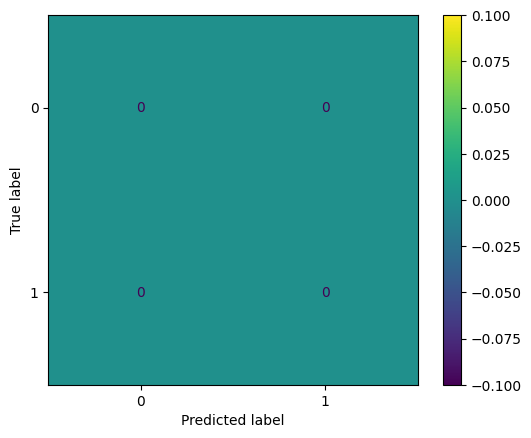

In [ ]:
# Create a Naive Bayes classifier
clf = GaussianNB()

# Train the classifier on the training set
clf.fit(X_train, y_train)

# Predict the classes of the test set
y_pred = clf.predict(X_test)

# Print the accuracy of the classifier
accuracy = accuracy_score(y_pred, y_test)
print(f"Accuracy :", accuracy)
# print("Accuracy:", clf.score(X_test, y_test))

f1 = f1_score(y_pred, y_test, average="weighted")
print("F1 score:", f1)

print(classification_report(y_test, y_pred))

labels = [0,1]
cm = confusion_matrix(y_test, y_pred, labels=labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot()

In [ ]:
def GaussianNBTrain(X_train,y_train, X_test, y_test, labels=2, display=False):
    # Create a Naive Bayes classifier
    clf = GaussianNB()

    # Train the classifier on the training set
    clf.fit(X_train, y_train)

    # Predict the classes of the test set
    y_pred = clf.predict(X_test)

    # Print the accuracy of the classifier
    accuracy = accuracy_score(y_pred, y_test)
    print("GaussianNB")
    print(f"Accuracy :", accuracy)
    # print("Accuracy:", clf.score(X_test, y_test))

    f1 = f1_score(y_pred, y_test, average="weighted")
    print("F1 score:", f1)

    if display:
        print(classification_report(y_test, y_pred))
        labels = range(labels)
        cm = confusion_matrix(y_test, y_pred, labels=labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
        disp.plot()

In [ ]:
def LogisticRegressionTrain(X_train, y_train, X_test, y_test, labels=2, display=False):
    # Initialize Logistic Regression model
    logistic_model = LogisticRegression(solver='lbfgs', multi_class='auto', max_iter=200)

    # Train the model
    logistic_model.fit(X_train, y_train)

    # Predictions on the test set
    y_pred = logistic_model.predict(X_test)

    # Measure accuracy
    accuracy = accuracy_score(y_pred, y_test)
    print("LogisticRegression")
    print(f"Accuracy :", accuracy)

    f1 = f1_score(y_pred, y_test, average="weighted")
    print("F1 score:", f1)

    if display:
        print(classification_report(y_test, y_pred))
        labels = range(labels)
        cm = confusion_matrix(y_test, y_pred, labels=labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
        disp.plot()

In [ ]:
def SVCTrain(X_train, y_train, X_test, y_test, labels=2, display=False):
    # Initialize SVM model
    svm_model = SVC(kernel='linear', C=1)

    # Train the model
    svm_model.fit(X_train, y_train)

    # Predictions on the test set
    y_pred = svm_model.predict(X_test)

    # Measure accuracy
    accuracy = accuracy_score(y_pred, y_test)
    print("SVM")
    print(f"Accuracy :", accuracy)

    f1 = f1_score(y_pred, y_test, average="weighted")
    print("F1 score:", f1)

    if display:
        print(classification_report(y_test, y_pred))
        labels = range(labels)
        cm = confusion_matrix(y_test, y_pred, labels=labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
        disp.plot()

In [ ]:
def RandomForestTrain(X_train, y_train, X_test, y_test, labels=2, display=False):
    # Initialize Random Forest model
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

    # Train the model
    rf_model.fit(X_train, y_train)

    # Predictions on the test set
    y_pred = rf_model.predict(X_test)

    # Measure accuracy
    accuracy = accuracy_score(y_pred, y_test)
    print("RandomForestClassifier")
    print(f"Accuracy :", accuracy)

    f1 = f1_score(y_pred, y_test, average="weighted")
    print("F1 score:", f1)

    if display:
        print(classification_report(y_test, y_pred))
        labels = range(labels)
        cm = confusion_matrix(y_test, y_pred, labels=labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
        disp.plot()

In [ ]:
def ANNTrain(X_train, y_train, X_test, y_test, labels=2, display=False):
    # Create an MLP classifier object
    mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000)

    # Train the classifier
    mlp_model.fit(X_train, y_train)

    # Predictions on the test set
    y_pred = mlp_model.predict(X_test)

    # Measure accuracy
    accuracy = accuracy_score(y_pred, y_test)
    print("Back Progation")
    print(f"Accuracy :", accuracy)

    f1 = f1_score(y_pred, y_test, average="weighted")
    print("F1 score:", f1)

    if display:
        print(classification_report(y_test, y_pred))
        labels = range(labels)
        cm = confusion_matrix(y_test, y_pred, labels=labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
        disp.plot()

GaussianNB
Accuracy : 0.8582375478927203
F1 score: 0.9219417782517677
LogisticRegression
Accuracy : 0.8601532567049809
F1 score: 0.9248197734294542


RandomForestClassifier
Accuracy : 0.8563218390804598
F1 score: 0.9000778099875997
Back Progation
Accuracy : 0.8601532567049809
F1 score: 0.9248197734294542
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.00      0.00      0.00        15
           2       0.00      0.00      0.00        19
           3       0.00      0.00      0.00        27
           4       0.86      1.00      0.92       449

    accuracy                           0.86       522
   macro avg       0.17      0.20      0.18       522
weighted avg       0.74      0.86      0.80       522



/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _wa

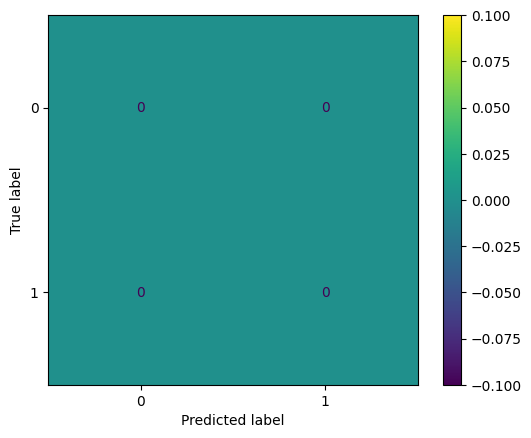

In [ ]:
GaussianNBTrain(X_train, y_train, X_test, y_test)
LogisticRegressionTrain(X_train, y_train, X_test, y_test)
RandomForestTrain(X_train, y_train, X_test, y_test)
ANNTrain(X_train, y_train, X_test, y_test, labels=2, display=True)

# Pre1 => Lab1

In [4]:
df = pd.read_csv('lab.csv')
data = pd.read_csv("Sumlab.csv")

In [5]:
df

,studentID,Prelab1,Prelab1-attempts,Prelab1-questions,Prelab1-growths,Prelab1-timeSpent,Prelab1-lastSubmit,Inlab1,Inlab1-attempts,Inlab1-questions,...,Prelab4-questions,Prelab4-growths,Prelab4-timeSpent,Prelab4-lastSubmit,Inlab4,Inlab4-attempts,Inlab4-questions,Inlab4-growths,Inlab4-timeSpent,Inlab4-lastSubmit
0,2113519,9.9,13.0,10.0,1.364,550.133333,1.644752e+09,9.272,10.0,10.0,...,7.0,4.285714,72.166667,1.650386e+09,8.750,9.0,8.0,1.25,35.616667,1.651856e+09
1,2110196,10.0,19.0,10.0,4.200,579.316667,1.644850e+09,9.236,14.0,10.0,...,7.0,0.000000,0.150000,1.650339e+09,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
2,1911660,10.0,15.0,10.0,0.500,148.933333,1.643299e+09,10.000,13.0,10.0,...,7.0,0.000000,118.950000,1.650177e+09,9.875,8.0,8.0,0.00,24.900000,1.651047e+09
3,2052555,10.0,12.0,10.0,0.100,22.600000,1.642844e+09,10.000,11.0,10.0,...,7.0,0.000000,0.383333,1.649640e+09,10.000,8.0,8.0,0.00,1.033333,1.649643e+09
4,2153379,10.0,10.0,10.0,0.000,3.100000,1.642775e+09,10.000,10.0,10.0,...,7.0,1.428571,40.916667,1.649903e+09,10.000,8.0,8.0,0.00,1.466667,1.650333e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,2153538,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
782,1652026,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
783,1915901,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00
784,1710710,0.0,0.0,0.0,0.000,0.000000,0.000000e+00,0.000,0.0,0.0,...,0.0,0.000000,0.000000,0.000000e+00,0.000,0.0,0.0,0.00,0.000000,0.000000e+00


In [7]:
def ranking(score):
    if score >= 8.5:
        return 4
    if score >= 7.0:
        return 3
    if score >= 5.5:
        return 2
    if score >= 4.0:
        return 1
    return 0
def passRanking(x):
    if x >= 5:
        return 1
    else:
        return 0

# Áp dụng hàm ranking cho cột "inlab"
#data['Inlab'] = data['Inlab'].apply(passRanking)

# Hiển thị DataFrame sau khi thêm cột mới
#data['Inlab'].value_counts()
# Áp dụng hàm ranking cho cột "inlab"
columns_to_rank = ['Inlab1', 'Inlab2', 'Inlab3', 'Inlab4']
for column in columns_to_rank:
    df[column] = df[column].apply(ranking)

df['Inlab1'].value_counts()

Inlab1
4    520
0    126
3     68
2     38
1     34
Name: count, dtype: int64

In [8]:

df = df[df['Prelab1-attempts']>5]
df = df[df['Prelab2-attempts']>5]
df = df[df['Prelab3-attempts']>5]
df = df[df['Prelab4-attempts']>5]
#df = df.drop(columns=['Prelab1-questions','Inlab1-questions','Prelab2-questions','Inlab2-questions','Prelab3-questions','Inlab3-questions','Prelab4-questions','Inlab4-questions'])
#df = df.drop(columns=['Prelab1-lastSubmit','Inlab1-lastSubmit','Prelab2-lastSubmit','Inlab2-lastSubmit','Prelab3-lastSubmit','Inlab3-lastSubmit','Prelab4-lastSubmit','Inlab4-lastSubmit'])
df


,studentID,Prelab1,Prelab1-attempts,Prelab1-questions,Prelab1-growths,Prelab1-timeSpent,Prelab1-lastSubmit,Inlab1,Inlab1-attempts,Inlab1-questions,...,Prelab4-questions,Prelab4-growths,Prelab4-timeSpent,Prelab4-lastSubmit,Inlab4,Inlab4-attempts,Inlab4-questions,Inlab4-growths,Inlab4-timeSpent,Inlab4-lastSubmit
0,2113519,9.900,13.0,10.0,1.364,550.133333,1.644752e+09,4,10.0,10.0,...,7.0,4.285714,72.166667,1.650386e+09,4,9.0,8.0,1.25,35.616667,1.651856e+09
1,2110196,10.000,19.0,10.0,4.200,579.316667,1.644850e+09,4,14.0,10.0,...,7.0,0.000000,0.150000,1.650339e+09,0,0.0,0.0,0.00,0.000000,0.000000e+00
2,1911660,10.000,15.0,10.0,0.500,148.933333,1.643299e+09,4,13.0,10.0,...,7.0,0.000000,118.950000,1.650177e+09,4,8.0,8.0,0.00,24.900000,1.651047e+09
3,2052555,10.000,12.0,10.0,0.100,22.600000,1.642844e+09,4,11.0,10.0,...,7.0,0.000000,0.383333,1.649640e+09,4,8.0,8.0,0.00,1.033333,1.649643e+09
4,2153379,10.000,10.0,10.0,0.000,3.100000,1.642775e+09,4,10.0,10.0,...,7.0,1.428571,40.916667,1.649903e+09,4,8.0,8.0,0.00,1.466667,1.650333e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738,2152935,10.000,10.0,10.0,0.000,153.516667,1.644849e+09,2,11.0,10.0,...,7.0,0.000000,2.166667,1.650273e+09,0,8.0,8.0,0.00,23.500000,1.650350e+09
739,2033308,8.464,11.0,10.0,0.182,11.133333,1.644858e+09,4,11.0,10.0,...,7.0,0.000000,10.716667,1.650300e+09,4,8.0,8.0,0.00,2.783333,1.650702e+09
742,513x1031,4.500,6.0,6.0,0.000,1.933333,1.644858e+09,0,0.0,0.0,...,7.0,0.000000,133.533333,1.650176e+09,0,0.0,0.0,0.00,0.000000,0.000000e+00
743,2152950,9.000,9.0,9.0,0.000,1.300000,1.644854e+09,4,11.0,10.0,...,7.0,0.000000,0.333333,1.650376e+09,4,8.0,8.0,0.00,3.083333,1.650253e+09


In [9]:
df.columns

Index(['studentID', 'Prelab1', 'Prelab1-attempts', 'Prelab1-questions',
       'Prelab1-growths', 'Prelab1-timeSpent', 'Prelab1-lastSubmit', 'Inlab1',
       'Inlab1-attempts', 'Inlab1-questions', 'Inlab1-growths',
       'Inlab1-timeSpent', 'Inlab1-lastSubmit', 'Prelab2', 'Prelab2-attempts',
       'Prelab2-questions', 'Prelab2-growths', 'Prelab2-timeSpent',
       'Prelab2-lastSubmit', 'Inlab2', 'Inlab2-attempts', 'Inlab2-questions',
       'Inlab2-growths', 'Inlab2-timeSpent', 'Inlab2-lastSubmit', 'Prelab3',
       'Prelab3-attempts', 'Prelab3-questions', 'Prelab3-growths',
       'Prelab3-timeSpent', 'Prelab3-lastSubmit', 'Inlab3', 'Inlab3-attempts',
       'Inlab3-questions', 'Inlab3-growths', 'Inlab3-timeSpent',
       'Inlab3-lastSubmit', 'Prelab4', 'Prelab4-attempts', 'Prelab4-questions',
       'Prelab4-growths', 'Prelab4-timeSpent', 'Prelab4-lastSubmit', 'Inlab4',
       'Inlab4-attempts', 'Inlab4-questions', 'Inlab4-growths',
       'Inlab4-timeSpent', 'Inlab4-lastSubmit'],


In [10]:
df = df.drop(columns=['studentID'])

In [11]:


# Tính ma trận tương quan
correlation_matrix = df.corr()

print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
                     Prelab1  Prelab1-attempts  Prelab1-questions  \
Prelab1             1.000000          0.098015           0.645995   
Prelab1-attempts    0.098015          1.000000           0.206653   
Prelab1-questions   0.645995          0.206653           1.000000   
Prelab1-growths    -0.005728          0.723357           0.041778   
Prelab1-timeSpent   0.139210          0.484515           0.118542   
Prelab1-lastSubmit -0.247637          0.306067          -0.112569   
Inlab1              0.436607          0.000131           0.234644   
Inlab1-attempts     0.103409          0.250135           0.130903   
Inlab1-questions    0.180770          0.065277           0.141800   
Inlab1-growths     -0.022353          0.292436           0.055198   
Inlab1-timeSpent    0.019749          0.029182           0.055647   
Inlab1-lastSubmit   0.099708          0.026257           0.141829   
Prelab2             0.320856          0.040712           0.157881   
Prelab2-attemp

In [12]:

# Tính ma trận tương quan
correlation_matrix = df.corr()

print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
                     Prelab1  Prelab1-attempts  Prelab1-questions  \
Prelab1             1.000000          0.098015           0.645995   
Prelab1-attempts    0.098015          1.000000           0.206653   
Prelab1-questions   0.645995          0.206653           1.000000   
Prelab1-growths    -0.005728          0.723357           0.041778   
Prelab1-timeSpent   0.139210          0.484515           0.118542   
Prelab1-lastSubmit -0.247637          0.306067          -0.112569   
Inlab1              0.436607          0.000131           0.234644   
Inlab1-attempts     0.103409          0.250135           0.130903   
Inlab1-questions    0.180770          0.065277           0.141800   
Inlab1-growths     -0.022353          0.292436           0.055198   
Inlab1-timeSpent    0.019749          0.029182           0.055647   
Inlab1-lastSubmit   0.099708          0.026257           0.141829   
Prelab2             0.320856          0.040712           0.157881   
Prelab2-attemp

In [13]:
df

,Prelab1,Prelab1-attempts,Prelab1-questions,Prelab1-growths,Prelab1-timeSpent,Prelab1-lastSubmit,Inlab1,Inlab1-attempts,Inlab1-questions,Inlab1-growths,...,Prelab4-questions,Prelab4-growths,Prelab4-timeSpent,Prelab4-lastSubmit,Inlab4,Inlab4-attempts,Inlab4-questions,Inlab4-growths,Inlab4-timeSpent,Inlab4-lastSubmit
0,9.900,13.0,10.0,1.364,550.133333,1.644752e+09,4,10.0,10.0,0.000,...,7.0,4.285714,72.166667,1.650386e+09,4,9.0,8.0,1.25,35.616667,1.651856e+09
1,10.000,19.0,10.0,4.200,579.316667,1.644850e+09,4,14.0,10.0,2.636,...,7.0,0.000000,0.150000,1.650339e+09,0,0.0,0.0,0.00,0.000000,0.000000e+00
2,10.000,15.0,10.0,0.500,148.933333,1.643299e+09,4,13.0,10.0,1.363,...,7.0,0.000000,118.950000,1.650177e+09,4,8.0,8.0,0.00,24.900000,1.651047e+09
3,10.000,12.0,10.0,0.100,22.600000,1.642844e+09,4,11.0,10.0,0.000,...,7.0,0.000000,0.383333,1.649640e+09,4,8.0,8.0,0.00,1.033333,1.649643e+09
4,10.000,10.0,10.0,0.000,3.100000,1.642775e+09,4,10.0,10.0,0.000,...,7.0,1.428571,40.916667,1.649903e+09,4,8.0,8.0,0.00,1.466667,1.650333e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738,10.000,10.0,10.0,0.000,153.516667,1.644849e+09,2,11.0,10.0,0.100,...,7.0,0.000000,2.166667,1.650273e+09,0,8.0,8.0,0.00,23.500000,1.650350e+09
739,8.464,11.0,10.0,0.182,11.133333,1.644858e+09,4,11.0,10.0,0.636,...,7.0,0.000000,10.716667,1.650300e+09,4,8.0,8.0,0.00,2.783333,1.650702e+09
742,4.500,6.0,6.0,0.000,1.933333,1.644858e+09,0,0.0,0.0,0.000,...,7.0,0.000000,133.533333,1.650176e+09,0,0.0,0.0,0.00,0.000000,0.000000e+00
743,9.000,9.0,9.0,0.000,1.300000,1.644854e+09,4,11.0,10.0,0.000,...,7.0,0.000000,0.333333,1.650376e+09,4,8.0,8.0,0.00,3.083333,1.650253e+09


In [14]:
# Pre1 => lab1
X1 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths']]
Y1 = df['Inlab1']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, Y1, test_size=0.2, random_state=42)
y_train1.value_counts()

Inlab1
4    380
3     36
0     27
2     22
1     15
Name: count, dtype: int64

In [15]:
import time
start_time = time.time()
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [500],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [4]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')# Sử dụng GridSearchCV để tìm giá trị tốt nhất cho các tham số
grid_search.fit(X_train1, y_train1)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42,max_features=4, **best_params)
cross_val_scores_a = cross_val_score(best_rf_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores_a)
print("Mean Cross-Validation Score:", cross_val_scores_a.mean())
best_rf_model.fit(X_train1, y_train1)
y_pred = best_rf_model.predict(X_test1)
accuracy_Random1 = accuracy_score(y_test1, y_pred)
print("Accuracy for Random Forest:", accuracy_Random1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
Cross-Validation Scores: [0.79166667 0.77083333 0.79166667 0.79166667 0.79166667 0.77083333
 0.79166667 0.79166667 0.79166667 0.79166667]
Mean Cross-Validation Score: 0.7875
Accuracy for Random Forest: 0.7666666666666667
Precision: 0.6470029239766082
Recall: 0.7666666666666667
F1-score: 0.6871409214092142
Training Time: 18.359242916107178 seconds


In [16]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import time

# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train1, y_train1)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())
# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test1)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test1, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


Naive Bayes Cross-Validation Scores: [0.79166667 0.79166667 0.79166667 0.79166667 0.79166667 0.79166667
 0.79166667 0.79166667 0.79166667 0.79166667]
Mean Naive Bayes Cross-Validation Score: 0.7916666666666667
Accuracy for Naive Bayes: 0.7583333333333333
Precision: 0.5750694444444444
Recall: 0.7583333333333333
F1-score: 0.6541074249605056
Training Time: 0.07770180702209473 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [17]:
print(classification_report(y_test1, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       1.00      0.20      0.33         5
           2       0.00      0.00      0.00         5
           3       0.00      0.00      0.00        14
           4       0.80      1.00      0.89        91

    accuracy                           0.77       120
   macro avg       0.36      0.24      0.24       120
weighted avg       0.65      0.77      0.69       120



In [18]:
#  mô hình Logistic Regression
start_time = time.time()
param_grid = {'C': [0.1]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train1, y_train1)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train1, y_train1)
cross_val_scores = cross_val_score(best_logreg_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test1)
accuracy_Logistis1 = accuracy_score(y_test1, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best C: 0.1
Cross-Validation Scores: [0.79166667 0.79166667 0.79166667 0.79166667 0.79166667 0.79166667
 0.79166667 0.79166667 0.79166667 0.79166667]
Mean Cross-Validation Score: 0.7916666666666667
Accuracy for Logistic Regression: 0.7583333333333333
Precision: 0.5750694444444444
Recall: 0.7583333333333333
F1-score: 0.6541074249605056
Training Time: 0.23674917221069336 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [19]:
#MLP classifier
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
start_time = time.time()

param_grid_ann = {
    'hidden_layer_sizes': [(50,)],
    'activation': ['relu'],
    'solver': ['adam'],
    'alpha': [0.0001],
    'max_iter': [500]
}
ann_model = MLPClassifier(random_state=42)
grid_search_ann = GridSearchCV(ann_model, param_grid_ann, cv=5)
grid_search_ann.fit(X_train1, y_train1)

best_params_ann = grid_search_ann.best_params_
print("Best Parameters for ANN:", best_params_ann)
best_ann_model = MLPClassifier(**best_params_ann, random_state=42)
best_ann_model.fit(X_train1, y_train1)
ann_cross_val_scores = cross_val_score(best_ann_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("ANN Cross-Validation Scores:", ann_cross_val_scores)
print("Mean ANN Cross-Validation Score:", ann_cross_val_scores.mean())
y_pred_ann = best_ann_model.predict(X_test1)
accuracy_ann1 = accuracy_score(y_test1, y_pred_ann)
print("Accuracy for ANN:", accuracy_ann1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for ANN: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50,), 'max_iter': 500, 'solver': 'adam'}
ANN Cross-Validation Scores: [0.79166667 0.79166667 0.79166667 0.79166667 0.08333333 0.79166667
 0.79166667 0.79166667 0.0625     0.0625    ]
Mean ANN Cross-Validation Score: 0.575
Accuracy for ANN: 0.7583333333333333
Precision: 0.5750694444444444
Recall: 0.7583333333333333
F1-score: 0.6541074249605056
Training Time: 0.722064733505249 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [20]:
# KNN 
k_values = [9]
start_time = time.time()
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [2]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train1, y_train1)
best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train1, y_train1)
knn_cross_val_scores = cross_val_score(best_knn_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test1)
accuracy_knn1 = accuracy_score(y_test1, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 9, 'p': 2, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.77083333 0.79166667 0.77083333 0.77083333 0.79166667 0.75
 0.8125     0.79166667 0.77083333 0.8125    ]
Mean KNN Cross-Validation Score: 0.7833333333333333
Accuracy for KNN: 0.725
Precision: 0.5750694444444444
Recall: 0.7583333333333333
F1-score: 0.6541074249605056
Training Time: 0.15327000617980957 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Pre1, lab1, pre2 => Lab2

In [21]:
# có vẻ như thiếu labNum
X2 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths', 'Inlab1','Inlab1-timeSpent', 'Inlab1-lastSubmit',
       'Inlab1-attempts', 'Inlab1-questions', 'Inlab1-growths', 'Prelab2', 'Prelab2-attempts','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-questions']]
Y2 = df['Inlab2']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2,stratify=Y2, test_size=0.2, random_state=42)
y_train2.value_counts()

Inlab2
4    433
3     26
1      8
0      7
2      6
Name: count, dtype: int64

In [22]:
start_time = time.time()

rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [100],
    'max_depth': [None],
    'min_samples_split': [10],
    'min_samples_leaf': [2]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=10, scoring='accuracy')
grid_search.fit(X_train2, y_train2)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42, **best_params)
cross_val_scores = cross_val_score(best_rf_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
best_rf_model.fit(X_train2, y_train2)
y_pred = best_rf_model.predict(X_test2)
accuracy_Random2 = accuracy_score(y_test2, y_pred)
print("Accuracy for Random Forest:", accuracy_Random2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Cross-Validation Scores: [0.91666667 0.91666667 0.91666667 0.89583333 0.89583333 0.89583333
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Cross-Validation Score: 0.9020833333333333
Accuracy for Random Forest: 0.9083333333333333
Precision: 0.8487288135593221
Recall: 0.9083333333333333
F1-score: 0.8726769911504425
Training Time: 4.605186700820923 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [23]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import time

# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train2, y_train2)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())

# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test2)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test2, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


Naive Bayes Cross-Validation Scores: [0.83333333 0.3125     0.625      0.5        0.5        0.5625
 0.45833333 0.64583333 0.58333333 0.60416667]
Mean Naive Bayes Cross-Validation Score: 0.5625
Accuracy for Naive Bayes: 0.5833333333333334
Precision: 0.887636793847974
Recall: 0.5833333333333334
F1-score: 0.6928326132712974
Training Time: 0.07859921455383301 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [24]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
X2 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths', 'Inlab1','Inlab1-timeSpent', 'Inlab1-lastSubmit',
       'Inlab1-attempts', 'Inlab1-questions', 'Inlab1-growths', 'Prelab2', 'Prelab2-attempts','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-questions']]
Y2 = df['Inlab2']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2,stratify=Y2, test_size=0.2, random_state=42)
y_train2.value_counts()
param_grid = {'C': [0.01]}
start_time = time.time()

logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=10)
grid_search.fit(X_train2, y_train2)

best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train2, y_train2)
cross_val_scores = cross_val_score(best_logreg_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test2)
accuracy_Logistis2 = accuracy_score(y_test2, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

Best C: 0.01


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

Cross-Validation Scores: [0.91666667 0.91666667 0.91666667 0.89583333 0.89583333 0.89583333
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Cross-Validation Score: 0.9020833333333333
Accuracy for Logistic Regression: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.8142669200897217 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [25]:

start_time = time.time()
param_grid = {'C': [0.01]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train2, y_train2)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train2, y_train2)
cross_val_scores = cross_val_score(best_logreg_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test2)
accuracy_Logistis2 = accuracy_score(y_test2, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

Best C: 0.01


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Cross-Validation Scores: [0.91666667 0.91666667 0.91666667 0.89583333 0.89583333 0.89583333
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Cross-Validation Score: 0.9020833333333333
Accuracy for Logistic Regression: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.6491687297821045 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

In [26]:
#MLP classifier
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
X2 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths', 'Inlab1','Inlab1-timeSpent', 'Inlab1-lastSubmit',
       'Inlab1-attempts', 'Inlab1-questions', 'Inlab1-growths', 'Prelab2', 'Prelab2-attempts','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-questions']]
Y2 = df['Inlab2']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2,stratify=Y2, test_size=0.2, random_state=42)
y_train2.value_counts()
start_time = time.time()
param_grid = {
    'hidden_layer_sizes': [(50,)],
    'max_iter': [1500],
    'learning_rate_init': [0.1],
    'alpha': [0.0001]
}
mlp_model = MLPClassifier()
grid_search = GridSearchCV(mlp_model, param_grid, cv=10, scoring='accuracy', verbose=1)
grid_search.fit(X_train2, y_train2)
print("Best parameters found:")
print(grid_search.best_params_)
best_mlp_model = grid_search.best_estimator_
y_pred_best = best_mlp_model.predict(X_test2)
accuracy_MLP2 = accuracy_score(y_pred_best, y_test2)
print(f"Best model accuracy: {accuracy_MLP2}")
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred_best, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Fitting 10 folds for each of 1 candidates, totalling 10 fits
Best parameters found:
{'alpha': 0.0001, 'hidden_layer_sizes': (50,), 'learning_rate_init': 0.1, 'max_iter': 1500}
Best model accuracy: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.47501492500305176 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [27]:
#KNN
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
k_values = [5]
start_time = time.time()
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [2]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train2, y_train2)
best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train2, y_train2)
knn_cross_val_scores = cross_val_score(best_knn_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test2)
accuracy_knn2 = accuracy_score(y_test2, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/threadpoolctl.py:1019: RuntimeWarning: libc not found. The ctypes module in Python 3.8 is maybe too old for this OS.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


KNN Cross-Validation Scores: [0.89583333 0.91666667 0.91666667 0.89583333 0.89583333 0.875
 0.89583333 0.89583333 0.875      0.89583333]
Mean KNN Cross-Validation Score: 0.8958333333333334
Accuracy for KNN: 0.8833333333333333
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.21760797500610352 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Pre1,lab1,pre2,lab2,pre3 => lab3

In [28]:
df.columns

Index(['Prelab1', 'Prelab1-attempts', 'Prelab1-questions', 'Prelab1-growths',
       'Prelab1-timeSpent', 'Prelab1-lastSubmit', 'Inlab1', 'Inlab1-attempts',
       'Inlab1-questions', 'Inlab1-growths', 'Inlab1-timeSpent',
       'Inlab1-lastSubmit', 'Prelab2', 'Prelab2-attempts', 'Prelab2-questions',
       'Prelab2-growths', 'Prelab2-timeSpent', 'Prelab2-lastSubmit', 'Inlab2',
       'Inlab2-attempts', 'Inlab2-questions', 'Inlab2-growths',
       'Inlab2-timeSpent', 'Inlab2-lastSubmit', 'Prelab3', 'Prelab3-attempts',
       'Prelab3-questions', 'Prelab3-growths', 'Prelab3-timeSpent',
       'Prelab3-lastSubmit', 'Inlab3', 'Inlab3-attempts', 'Inlab3-questions',
       'Inlab3-growths', 'Inlab3-timeSpent', 'Inlab3-lastSubmit', 'Prelab4',
       'Prelab4-attempts', 'Prelab4-questions', 'Prelab4-growths',
       'Prelab4-timeSpent', 'Prelab4-lastSubmit', 'Inlab4', 'Inlab4-attempts',
       'Inlab4-questions', 'Inlab4-growths', 'Inlab4-timeSpent',
       'Inlab4-lastSubmit'],
      dtype='

In [29]:
# có vẻ như thiếu labNum
X3 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths', 'Inlab1', 'Inlab1-attempts', 'Inlab1-questions','Inlab1-timeSpent', 'Inlab1-lastSubmit',
       'Inlab1-growths', 'Prelab2', 'Prelab2-attempts', 'Prelab2-questions','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-growths', 'Inlab2', 'Inlab2-attempts', 'Inlab2-questions','Inlab2-timeSpent', 'Inlab2-lastSubmit',
       'Inlab2-growths', 'Prelab3', 'Prelab3-attempts', 'Prelab3-questions','Prelab3-timeSpent', 'Prelab3-lastSubmit',
       'Prelab3-growths']]
Y3 = df['Inlab3']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, Y3, test_size=0.2, random_state=42)
y_train1.value_counts()

Inlab1
4    380
3     36
0     27
2     22
1     15
Name: count, dtype: int64

In [30]:
start_time = time.time()
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [500],
    'max_depth': [None],
    'min_samples_split': [10],
    'min_samples_leaf': [1]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=10, scoring='accuracy')
grid_search.fit(X_train3, y_train3)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42,max_features=4, **best_params)
cross_val_scores = cross_val_score(best_rf_model, X_train3, y_train3, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
best_rf_model.fit(X_train3, y_train3)
y_pred = best_rf_model.predict(X_test3)
accuracy_Random = accuracy_score(y_test3, y_pred)
print("Accuracy for Random Forest:", accuracy_Random)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  warnings.warn(


Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 500}
Cross-Validation Scores: [0.92708333 0.92708333 0.92708333 0.92708333 0.92708333]
Mean Cross-Validation Score: 0.9270833333333334
Accuracy for Random Forest: 0.9083333333333333
Precision: 0.8250694444444444
Recall: 0.9083333333333333
F1-score: 0.8647016011644832
Training Time: 18.853291749954224 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [31]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import time

# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train3, y_train3)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train3, y_train3, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())

# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test3)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test3, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


Naive Bayes Cross-Validation Scores: [0.4375     0.3125     0.5        0.45833333 0.60416667 0.35416667
 0.54166667 0.29166667 0.41666667 0.41666667]
Mean Naive Bayes Cross-Validation Score: 0.4333333333333333
Accuracy for Naive Bayes: 0.475
Precision: 0.9183985605038237
Recall: 0.475
F1-score: 0.5872585153625933
Training Time: 0.22424101829528809 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [32]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
start_time = time.time()
param_grid = {'C': [0.001]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train3, y_train3)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train3, y_train3)
cross_val_scores = cross_val_score(best_logreg_model, X_train3, y_train3, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test3)
accuracy_Logistis = accuracy_score(y_test3, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Best C: 0.001


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Cross-Validation Scores: [0.91666667 0.92708333 0.92708333 0.92708333 0.92708333]
Mean Cross-Validation Score: 0.925
Accuracy for Logistic Regression: 0.9083333333333333
Precision: 0.8250694444444444
Recall: 0.9083333333333333
F1-score: 0.8647016011644832
Training Time: 1.1645629405975342 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [33]:
#MLP classifier
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
start_time = time.time()
param_grid = {
    'hidden_layer_sizes': [(150,)],
    'max_iter': [1000],
    'learning_rate_init': [0.1],
    'alpha': [0.01]
}
mlp_model = MLPClassifier()
grid_search = GridSearchCV(mlp_model, param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train3, y_train3)

print("Best parameters found:")
print(grid_search.best_params_)
best_mlp_model = grid_search.best_estimator_
y_pred_best = best_mlp_model.predict(X_test3)
accuracy_MLP = accuracy_score(y_pred_best, y_test3)
print(f"Best model accuracy: {accuracy_MLP}")
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best parameters found:
{'alpha': 0.01, 'hidden_layer_sizes': (150,), 'learning_rate_init': 0.1, 'max_iter': 1000}
Best model accuracy: 0.9083333333333333
Precision: 0.8250694444444444
Recall: 0.9083333333333333
F1-score: 0.8647016011644832
Training Time: 1.6190741062164307 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [34]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
start_time = time.time()

k_values = [3]
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [1]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train3, y_train3)
best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train3, y_train3)

knn_cross_val_scores = cross_val_score(best_knn_model, X_train1, y_train1, cv=5, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test3)
accuracy_knn = accuracy_score(y_test3, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.76041667 0.73958333 0.73958333 0.72916667 0.73958333]
Mean KNN Cross-Validation Score: 0.7416666666666667
Accuracy for KNN: 0.875
Precision: 0.8250694444444444
Recall: 0.9083333333333333
F1-score: 0.8647016011644832
Training Time: 0.3762359619140625 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Inlab4


In [35]:
# có vẻ như thiếu labNum
X4 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths', 'Inlab1', 'Inlab1-attempts', 'Inlab1-questions','Inlab1-timeSpent', 'Inlab1-lastSubmit',
       'Inlab1-growths', 'Prelab2', 'Prelab2-attempts', 'Prelab2-questions','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-growths', 'Inlab2', 'Inlab2-attempts', 'Inlab2-questions','Inlab2-timeSpent', 'Inlab2-lastSubmit',
       'Inlab2-growths', 'Prelab3', 'Prelab3-attempts', 'Prelab3-questions','Prelab3-timeSpent', 'Prelab3-lastSubmit',
       'Prelab3-growths', 'Inlab3', 'Inlab3-attempts', 'Inlab3-questions','Inlab3-timeSpent', 'Inlab3-lastSubmit',
       'Inlab3-growths', 'Prelab4', 'Prelab4-attempts', 'Prelab4-questions','Prelab4-timeSpent', 'Prelab4-lastSubmit',
       'Prelab4-growths']]
Y4 = df['Inlab4']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, Y4,stratify=Y4, test_size=0.2, random_state=42)
Y4.value_counts()

Inlab4
4    542
0     25
2     14
3     12
1      7
Name: count, dtype: int64

In [36]:
start_time = time.time()
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [ 1000],
    'max_depth': [None],
    'min_samples_split': [ 10],
    'min_samples_leaf': [1]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train4, y_train4)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42,max_features=4, **best_params)
cross_val_scores = cross_val_score(best_rf_model, X_train4, y_train4, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
best_rf_model.fit(X_train4, y_train4)
y_pred = best_rf_model.predict(X_test4)
accuracy_Random = accuracy_score(y_test4, y_pred)
print("Accuracy for Random Forest:", accuracy_Random)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 1000}
Cross-Validation Scores: [0.91666667 0.90625    0.90625    0.91666667 0.89583333]
Mean Cross-Validation Score: 0.9083333333333332
Accuracy for Random Forest: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 31.20959782600403 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


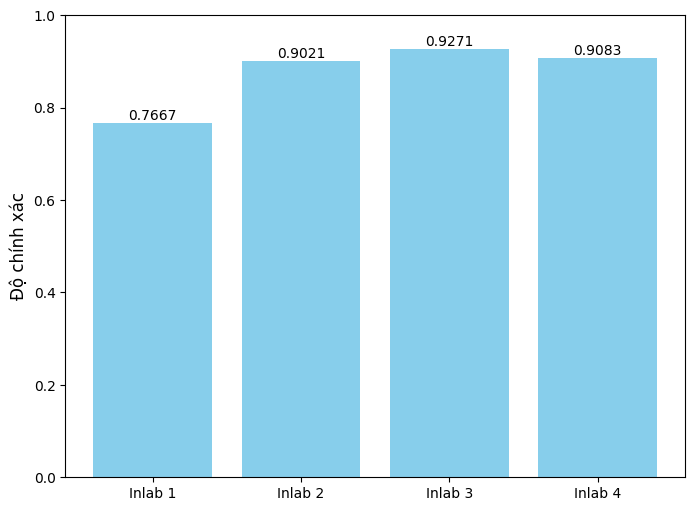

In [10]:
import matplotlib.pyplot as plt

# Mean Cross-Validation Scores
scores = [0.7667, 0.9021, 0.9271, 0.9083]
iterations = ['Inlab 1', 'Inlab 2', 'Inlab 3', 'Inlab 4']

# Plotting
plt.figure(figsize=(8, 6))
bars = plt.bar(iterations, scores, color='skyblue')

# Adding labels and title
plt.xlabel('', fontsize=12)
plt.ylabel('Độ chính xác', fontsize=12)
plt.ylim(0, 1)  # Set y-axis range from 0 to 1

# Annotate the bars with their values
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.4f}', 
             ha='center', va='bottom', fontsize=10)

# Display the plot
plt.show()


In [4]:
import matplotlib.pyplot as plt

# Mean Cross-Validation Scores
scores = [0.7667, 0.9021, 0.9271, 0.9083]

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(scores, marker='o', linestyle='-', color='b')

# Adding labels and title
plt.title('Mean Cross-Validation Scores')
plt.xlabel('Iteration')
plt.ylabel('Score')
plt.xticks(range(len(scores)), ['Iteration 1', 'Iteration 2', 'Iteration 3', 'Iteration 4'])

# Show plot
plt.ylim([0, 1.0])
plt.grid(True)
plt.show()


TypeError: bar() missing 1 required positional argument: 'height'

<Figure size 800x600 with 0 Axes>

In [37]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import time

# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train4, y_train4)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train4, y_train4, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())

# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test4)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test4, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Naive Bayes Cross-Validation Scores: [0.5625     0.625      0.54166667 0.54166667 0.41666667 0.60416667
 0.47916667 0.5        0.45833333 0.47916667]
Mean Naive Bayes Cross-Validation Score: 0.5208333333333333
Accuracy for Naive Bayes: 0.6
Precision: 0.8907886904761905
Recall: 0.6
F1-score: 0.7040880916398361
Training Time: 0.19106698036193848 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [38]:


importances = best_rf_model.feature_importances_

# các đặc trưng
feature_names = ['Prelab1', 'Prelab1-attempts', 'Prelab1-questions',
       'Prelab1-growths', 'Inlab1', 'Inlab1-attempts', 'Inlab1-questions',
       'Inlab1-growths', 'Prelab2', 'Prelab2-attempts', 'Prelab2-questions',
       'Prelab2-growths']  # Thay thế bằng tên thực của các đặc trưng

print("Mức độ quan trọng của các đặc trưng:")
for name, importance in zip(feature_names, importances):
    print(f"{name}: {importance}")

Mức độ quan trọng của các đặc trưng:
Prelab1: 0.0427335846401439
Prelab1-attempts: 0.025276888142266255
Prelab1-questions: 0.011628710487165165
Prelab1-growths: 0.04511648104334359
Inlab1: 0.040159040850446005
Inlab1-attempts: 0.020219037296499646
Inlab1-questions: 0.011621680335207699
Inlab1-growths: 0.014098002531537757
Prelab2: 0.0017462510065443023
Prelab2-attempts: 0.022987813111995714
Prelab2-questions: 0.03202915670466749
Prelab2-growths: 0.01765964663347749


In [39]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
start_time = time.time()
param_grid = {'C': [0.01]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train4, y_train4)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train4, y_train1)
cross_val_scores = cross_val_score(best_logreg_model, X_train4, y_train4, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test4)
accuracy_Logistis = accuracy_score(y_test4, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

Best C: 0.01
Cross-Validation Scores: [0.90625    0.90625    0.90625    0.90625    0.89583333]
Mean Cross-Validation Score: 0.9041666666666666
Accuracy for Logistic Regression: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.827416181564331 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

In [40]:
#MLP classifier
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
start_time = time.time()
param_grid = {
    'hidden_layer_sizes': [ (150,)],
    'max_iter': [1000],
    'learning_rate_init': [0.001],
    'alpha': [ 0.01]
}
mlp_model = MLPClassifier()
grid_search = GridSearchCV(mlp_model, param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train4, y_train4)

print("Best parameters found:")
print(grid_search.best_params_)
best_mlp_model = grid_search.best_estimator_
y_pred_best = best_mlp_model.predict(X_test4)
accuracy_MLP = accuracy_score(y_pred_best, y_test4)
print(f"Best model accuracy: {accuracy_MLP}")
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best parameters found:
{'alpha': 0.01, 'hidden_layer_sizes': (150,), 'learning_rate_init': 0.001, 'max_iter': 1000}
Best model accuracy: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.48140907287597656 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [41]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
start_time = time.time()
k_values = [9]
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [ 2]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train4, y_train4)

best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train4, y_train4)
knn_cross_val_scores = cross_val_score(best_knn_model, X_train4, y_train4, cv=5, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test4)
accuracy_knn = accuracy_score(y_test4, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 9, 'p': 2, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.90625    0.90625    0.90625    0.90625    0.89583333]
Mean KNN Cross-Validation Score: 0.9041666666666666
Accuracy for KNN: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.28424882888793945 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [42]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# Giả sử df là dataframe chứa dữ liệu của bạn

# Tách X và Y
X1 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit', 'Prelab1-growths']]
Y1 = df['Inlab1']

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, Y1, test_size=0.2, random_state=42)

# Khởi tạo mô hình Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Huấn luyện mô hình trên tập huấn luyện
rf_model.fit(X_train1, y_train1)

# Độ quan trọng của các đặc trưng
importances = rf_model.feature_importances_

# Tạo DataFrame để lưu trữ độ quan trọng của các đặc trưng
feature_importance_df = pd.DataFrame({'Feature': X_train1.columns, 'Importance': importances})

# Sắp xếp DataFrame theo độ quan trọng giảm dần
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# In ra độ quan trọng của các đặc trưng
print(feature_importance_df)


              Feature  Importance
4  Prelab1-lastSubmit    0.252030
3   Prelab1-timeSpent    0.232660
0             Prelab1    0.214911
5     Prelab1-growths    0.162461
1    Prelab1-attempts    0.115570
2   Prelab1-questions    0.022368


In [43]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Chia dữ liệu thành X và Y
X1 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions', 'Prelab1-timeSpent', 'Prelab1-lastSubmit', 'Prelab1-growths']]
Y1 = df['Inlab1']

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, Y1, test_size=0.2, random_state=42)

# Xây dựng mô hình Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train1, y_train1)

# Tính toán Gini Importance
gini_importance = rf_model.feature_importances_

# In ra độ quan trọng của từng đặc trưng
for i, feature in enumerate(X1.columns):
    print(f'Feature {feature}: {gini_importance[i]}')


Feature Prelab1: 0.2149114280535872
Feature Prelab1-attempts: 0.11556999833093105
Feature Prelab1-questions: 0.022367557753579487
Feature Prelab1-timeSpent: 0.23266030766307655
Feature Prelab1-lastSubmit: 0.2520297674810207
Feature Prelab1-growths: 0.162460940717805


# Mở rộng

In [ ]:
"""Random Forest, Gaussian Naive Bayes, Logistic Regression,KNN"""

'Random Forest, Gaussian Naive Bayes, Logistic Regression,KNN'

In [ ]:
def ranking(score):
    if score >= 8.5:
        return 4
    if score >= 7.0:
        return 3
    if score >= 5.5:
        return 2
    if score >= 4.0:
        return 1
    return 0
columns_to_rank = ['Inlab1', 'Inlab2', 'Inlab3', 'Inlab4']
for column in columns_to_rank:
    df[column] = df[column].apply(ranking)

In [ ]:
df = df[df['Prelab1-attempts']>5]
df = df[df['Prelab2-attempts']>5]
df = df[df['Prelab3-attempts']>5]
df = df[df['Prelab4-attempts']>5]

In [ ]:
# Pre1 => lab1
X1 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths']]
Y1 = df['Inlab1']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, Y1, test_size=0.2,stratify=df['Inlab1'] ,random_state=42)

In [ ]:
# Random Forest
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [500],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [4]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')# Sử dụng GridSearchCV để tìm giá trị tốt nhất cho các tham số
grid_search.fit(X_train1, y_train1)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42,max_features=4, **best_params)
cross_val_scores_a1 = cross_val_score(best_rf_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores_a1)
print("Mean Cross-Validation Score:", cross_val_scores_a1.mean())
best_rf_model.fit(X_train1, y_train1)
y_pred = best_rf_model.predict(X_test1)
accuracy_Random1 = accuracy_score(y_test1, y_pred)
print("Accuracy for Random Forest:", accuracy_Random1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
Cross-Validation Scores: [0.79166667 0.79166667 0.79166667 0.79166667 0.79166667 0.75
 0.8125     0.75       0.79166667 0.79166667]
Mean Cross-Validation Score: 0.7854166666666667
Accuracy for Random Forest: 0.7916666666666666
Precision: 0.6652898550724639
Recall: 0.7916666666666666
F1-score: 0.7171251993620414


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Gaussian Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train1, y_train1)
nb_cross_val_scores = cross_val_score(nb_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())
y_pred_nb = nb_model.predict(X_test1)
accuracy_nb = accuracy_score(y_test1, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)


Naive Bayes Cross-Validation Scores: [0.79166667 0.79166667 0.79166667 0.79166667 0.79166667 0.79166667
 0.79166667 0.77083333 0.77083333 0.77083333]
Mean Naive Bayes Cross-Validation Score: 0.7854166666666667
Accuracy for Naive Bayes: 0.7833333333333333
Precision: 0.613611111111111
Recall: 0.7833333333333333
F1-score: 0.6881619937694705


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#  mô hình Logistic Regression
start_time = time.time()
param_grid = {'C': [0.1]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train1, y_train1)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train1, y_train1)
cross_val_scores = cross_val_score(best_logreg_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test1)
accuracy_Logistis1 = accuracy_score(y_test1, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best C: 0.1
Cross-Validation Scores: [0.79166667 0.79166667 0.79166667 0.79166667 0.79166667 0.79166667
 0.79166667 0.77083333 0.77083333 0.77083333]
Mean Cross-Validation Score: 0.7854166666666667
Accuracy for Logistic Regression: 0.7833333333333333
Precision: 0.613611111111111
Recall: 0.7833333333333333
F1-score: 0.6881619937694705
Training Time: 0.19429802894592285 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# KNN 
k_values = [9]
start_time = time.time()
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [2]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train1, y_train1)
best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train1, y_train1)
knn_cross_val_scores = cross_val_score(best_knn_model, X_train1, y_train1, cv=10, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test1)
accuracy_knn1 = accuracy_score(y_test1, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn1)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 9, 'p': 2, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.77083333 0.75       0.75       0.79166667 0.77083333 0.77083333
 0.79166667 0.70833333 0.72916667 0.70833333]
Mean KNN Cross-Validation Score: 0.7541666666666667
Accuracy for KNN: 0.775
Precision: 0.613611111111111
Recall: 0.7833333333333333
F1-score: 0.6881619937694705
Training Time: 0.16021490097045898 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


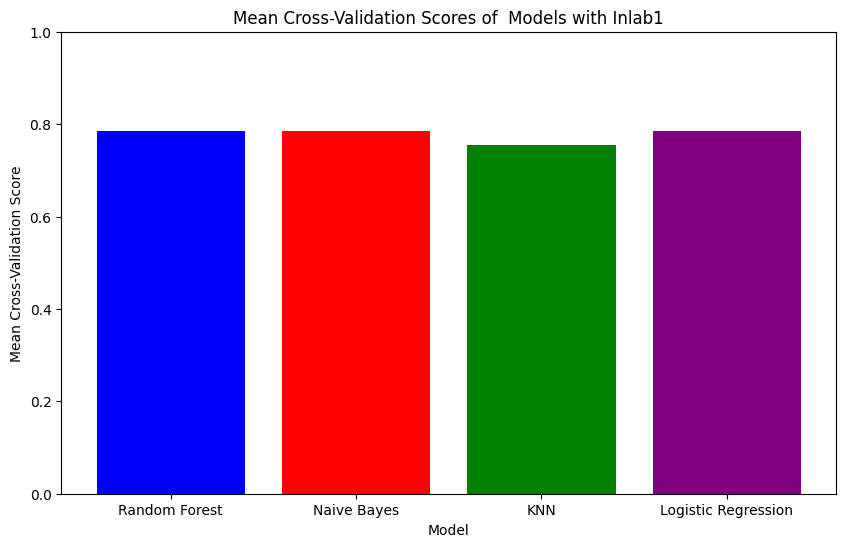

In [ ]:
mean_rf_score = 0.7854166666666667
mean_nb_score = 0.7854166666666667
mean_knn_score = 0.7541666666666667
mean_lr_score = 0.7854166666666667

# Mean Cross-Validation Scores for the models
mean_scores = {
    "Random Forest": mean_rf_score,
    "Naive Bayes": mean_nb_score,
    "KNN": mean_knn_score,
    "Logistic Regression": mean_lr_score
}

# Plotting the chart
plt.figure(figsize=(10, 6))
plt.bar(mean_scores.keys(), mean_scores.values(), color=['blue', 'red', 'green', 'purple'])
plt.xlabel("Model")
plt.ylabel("Mean Cross-Validation Score")
plt.title("Mean Cross-Validation Scores of  Models with Inlab1")
plt.ylim(0, 1)  # Ensure the y-axis ranges from 0 to 1
plt.show()

In [ ]:
# Pre2 => lab2
X2 = df[['Prelab2', 'Prelab2-attempts', 'Prelab2-questions','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-growths']]
Y2 = df['Inlab2']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2, test_size=0.2,stratify=df['Inlab2'] ,random_state=42)

In [ ]:


rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [100],
    'max_depth': [None],
    'min_samples_split': [10],
    'min_samples_leaf': [2]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=10, scoring='accuracy')
grid_search.fit(X_train2, y_train2)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42, **best_params)
cross_val_scores = cross_val_score(best_rf_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
best_rf_model.fit(X_train2, y_train2)
y_pred = best_rf_model.predict(X_test2)
accuracy_Random2 = accuracy_score(y_test2, y_pred)
print("Accuracy for Random Forest:", accuracy_Random2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Cross-Validation Scores: [0.91666667 0.91666667 0.91666667 0.89583333 0.875      0.89583333
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Cross-Validation Score: 0.9
Accuracy for Random Forest: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 86.7865378856659 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:


# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train2, y_train2)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())

# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test2)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test2, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


Naive Bayes Cross-Validation Scores: [0.91666667 0.91666667 0.875      0.89583333 0.89583333 0.89583333
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Naive Bayes Cross-Validation Score: 0.8979166666666668
Accuracy for Naive Bayes: 0.8916666666666667
Precision: 0.8092436974789916
Recall: 0.8916666666666667
F1-score: 0.8484581497797357
Training Time: 0.10538816452026367 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
X2 = df[['Prelab1', 'Prelab1-attempts', 'Prelab1-questions','Prelab1-timeSpent', 'Prelab1-lastSubmit',
       'Prelab1-growths', 'Inlab1','Inlab1-timeSpent', 'Inlab1-lastSubmit',
       'Inlab1-attempts', 'Inlab1-questions', 'Inlab1-growths', 'Prelab2', 'Prelab2-attempts','Prelab2-timeSpent', 'Prelab2-lastSubmit',
       'Prelab2-questions']]
Y2 = df['Inlab2']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2,stratify=Y2, test_size=0.2, random_state=42)
y_train2.value_counts()
param_grid = {'C': [0.01]}
start_time = time.time()

logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=10)
grid_search.fit(X_train2, y_train2)

best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train2, y_train2)
cross_val_scores = cross_val_score(best_logreg_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test2)
accuracy_Logistis2 = accuracy_score(y_test2, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

I

Best C: 0.01
Cross-Validation Scores: [0.91666667 0.91666667 0.91666667 0.89583333 0.89583333 0.89583333
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Cross-Validation Score: 0.9020833333333333
Accuracy for Logistic Regression: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.846851110458374 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

In [ ]:
#KNN
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
k_values = [5]
start_time = time.time()
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [2]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train2, y_train2)
best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train2, y_train2)
knn_cross_val_scores = cross_val_score(best_knn_model, X_train2, y_train2, cv=10, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test2)
accuracy_knn2 = accuracy_score(y_test2, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn2)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.89583333 0.91666667 0.91666667 0.89583333 0.89583333 0.875
 0.89583333 0.89583333 0.875      0.89583333]
Mean KNN Cross-Validation Score: 0.8958333333333334
Accuracy for KNN: 0.8833333333333333
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.20178484916687012 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


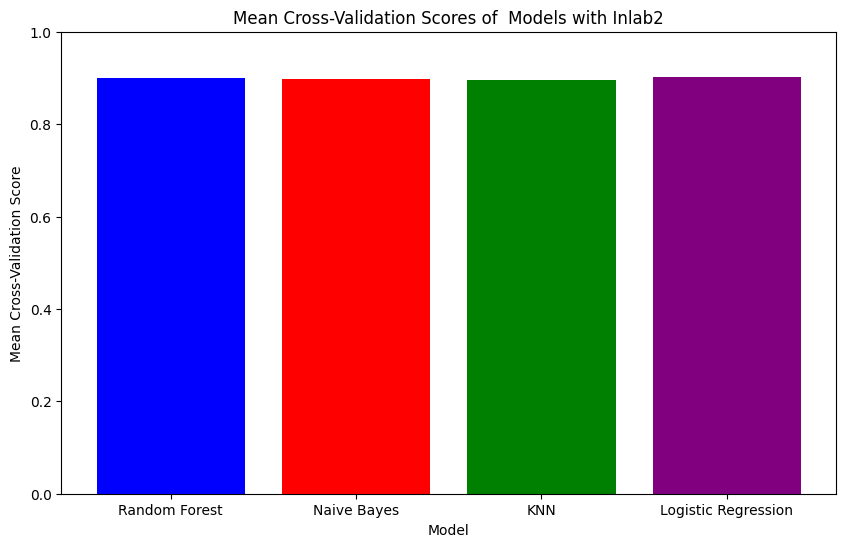

In [ ]:
mean_rf_score = 0.90
mean_nb_score = 0.8979166666666668
mean_knn_score = 0.8958333333333334
mean_lr_score = 0.9020833333333333

# Mean Cross-Validation Scores for the models
mean_scores = {
    "Random Forest": mean_rf_score,
    "Naive Bayes": mean_nb_score,
    "KNN": mean_knn_score,
    "Logistic Regression": mean_lr_score
}

# Plotting the chart
plt.figure(figsize=(10, 6))
plt.bar(mean_scores.keys(), mean_scores.values(), color=['blue', 'red', 'green', 'purple'])
plt.xlabel("Model")
plt.ylabel("Mean Cross-Validation Score")
plt.title("Mean Cross-Validation Scores of  Models with Inlab2")
plt.ylim(0, 1)  # Ensure the y-axis ranges from 0 to 1
plt.show()

In [ ]:
# Pre3 => lab3
X3 = df[['Prelab3', 'Prelab3-attempts', 'Prelab3-questions','Prelab3-timeSpent', 'Prelab3-lastSubmit',
       'Prelab3-growths']]
Y3 = df['Inlab3']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, Y3, test_size=0.2,stratify=df['Inlab3'] ,random_state=42)

In [ ]:
start_time = time.time()
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [500],
    'max_depth': [None],
    'min_samples_split': [10],
    'min_samples_leaf': [1]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=10, scoring='accuracy')
grid_search.fit(X_train3, y_train3)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42,max_features=4, **best_params)
cross_val_scores = cross_val_score(best_rf_model, X_train3, y_train3, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
best_rf_model.fit(X_train3, y_train3)
y_pred = best_rf_model.predict(X_test3)
accuracy_Random = accuracy_score(y_test3, y_pred)
print("Accuracy for Random Forest:", accuracy_Random)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 500}
Cross-Validation Scores: [0.92708333 0.91666667 0.92708333 0.89583333 0.91666667]
Mean Cross-Validation Score: 0.9166666666666667
Accuracy for Random Forest: 0.9166666666666666
Precision: 0.8550420168067228
Recall: 0.9166666666666666
F1-score: 0.8847826086956522
Training Time: 13.96841287612915 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import time

# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train3, y_train3)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train3, y_train3, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())

# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test3)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test3, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


Naive Bayes Cross-Validation Scores: [0.9375     0.9375     0.9375     0.91666667 0.91666667 0.91666667
 0.91666667 0.91666667 0.91666667 0.91666667]
Mean Naive Bayes Cross-Validation Score: 0.9229166666666666
Accuracy for Naive Bayes: 0.925
Precision: 0.8556250000000001
Recall: 0.925
F1-score: 0.888961038961039
Training Time: 0.07675409317016602 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
start_time = time.time()
param_grid = {'C': [0.001]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train3, y_train3)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train3, y_train3)
cross_val_scores = cross_val_score(best_logreg_model, X_train3, y_train3, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
y_pred = best_logreg_model.predict(X_test3)
accuracy_Logistis = accuracy_score(y_test3, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best C: 0.001
Cross-Validation Scores: [0.92708333 0.92708333 0.92708333 0.91666667 0.91666667]
Mean Cross-Validation Score: 0.9229166666666666
Accuracy for Logistic Regression: 0.925
Precision: 0.8556250000000001
Recall: 0.925
F1-score: 0.888961038961039
Training Time: 0.17741990089416504 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
start_time = time.time()

k_values = [3]
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [1]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train3, y_train3)
best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train3, y_train3)

knn_cross_val_scores = cross_val_score(best_knn_model, X_train1, y_train1, cv=5, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test3)
accuracy_knn = accuracy_score(y_test3, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test3, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.72916667 0.70833333 0.71875    0.70833333 0.66666667]
Mean KNN Cross-Validation Score: 0.70625
Accuracy for KNN: 0.9083333333333333
Precision: 0.8556250000000001
Recall: 0.925
F1-score: 0.888961038961039
Training Time: 0.11164689064025879 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


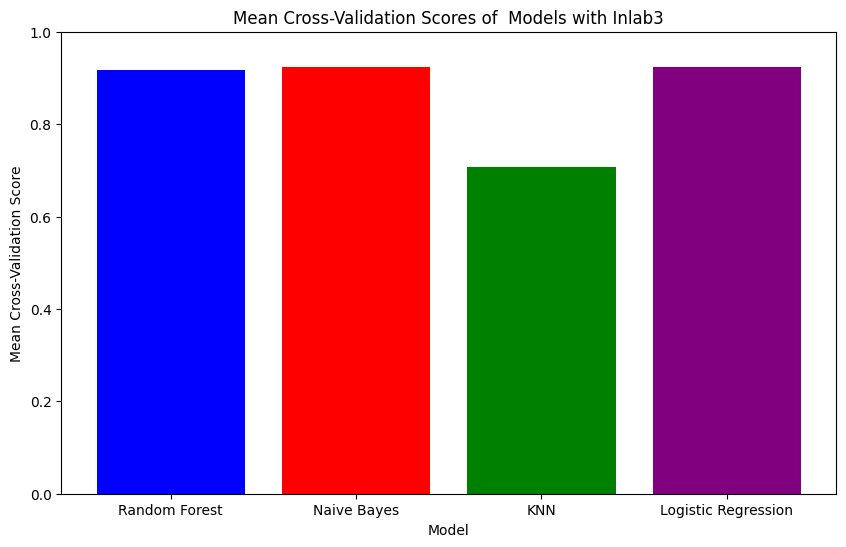

In [ ]:
mean_rf_score = 0.9166666666666667
mean_nb_score = 0.9229166666666666
mean_knn_score = 0.70625
mean_lr_score = 0.9229166666666666

# Mean Cross-Validation Scores for the models
mean_scores = {
    "Random Forest": mean_rf_score,
    "Naive Bayes": mean_nb_score,
    "KNN": mean_knn_score,
    "Logistic Regression": mean_lr_score
}

# Plotting the chart
plt.figure(figsize=(10, 6))
plt.bar(mean_scores.keys(), mean_scores.values(), color=['blue', 'red', 'green', 'purple'])
plt.xlabel("Model")
plt.ylabel("Mean Cross-Validation Score")
plt.title("Mean Cross-Validation Scores of  Models with Inlab3")
plt.ylim(0, 1)  # Ensure the y-axis ranges from 0 to 1
plt.show()

In [ ]:
# Pre4 => lab4
X4 = df[['Prelab4', 'Prelab4-attempts', 'Prelab4-questions','Prelab4-timeSpent', 'Prelab4-lastSubmit',
       'Prelab4-growths']]
Y4 = df['Inlab4']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, Y4, test_size=0.2,stratify=df['Inlab4'] ,random_state=42)

In [ ]:
start_time = time.time()
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [ 1000],
    'max_depth': [None],
    'min_samples_split': [ 10],
    'min_samples_leaf': [1]
}
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train4, y_train4)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_rf_model = RandomForestClassifier(random_state=42,max_features=4, **best_params)
cross_val_scores = cross_val_score(best_rf_model, X_train4, y_train4, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
out4rf =cross_val_scores.mean()
best_rf_model.fit(X_train4, y_train4)
y_pred = best_rf_model.predict(X_test4)
accuracy_Random = accuracy_score(y_test4, y_pred)
print("Accuracy for Random Forest:", accuracy_Random)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 1000}
Cross-Validation Scores: [0.89583333 0.89583333 0.90625    0.89583333 0.89583333]
Mean Cross-Validation Score: 0.8979166666666668
Accuracy for Random Forest: 0.8916666666666667
Precision: 0.8161016949152542
Recall: 0.8916666666666667
F1-score: 0.8522123893805309
Training Time: 16.67019295692444 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import time

# Bắt đầu đếm thời gian
start_time = time.time()

# Tạo mô hình Gaussian Naive Bayes
nb_model = GaussianNB()

# Huấn luyện mô hình
nb_model.fit(X_train4, y_train4)

# Đánh giá mô hình bằng cross-validation
nb_cross_val_scores = cross_val_score(nb_model, X_train4, y_train4, cv=10, scoring='accuracy')
print("Naive Bayes Cross-Validation Scores:", nb_cross_val_scores)
print("Mean Naive Bayes Cross-Validation Score:", nb_cross_val_scores.mean())
out4nb =nb_cross_val_scores.mean()
# Dự đoán trên tập test
y_pred_nb = nb_model.predict(X_test4)

# Tính độ chính xác
accuracy_nb = accuracy_score(y_test4, y_pred_nb)
print("Accuracy for Naive Bayes:", accuracy_nb)

# Tính các chỉ số precision, recall và f1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred_nb, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)

# Tính thời gian huấn luyện
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  warnings.warn(


Naive Bayes Cross-Validation Scores: [0.91666667 0.91666667 0.91666667 0.91666667 0.89583333 0.875
 0.89583333 0.89583333 0.89583333 0.89583333]
Mean Naive Bayes Cross-Validation Score: 0.9020833333333333
Accuracy for Naive Bayes: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.08538603782653809 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
start_time = time.time()
param_grid = {'C': [0.01]}
logreg = LogisticRegression()
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train4, y_train4)
best_C = grid_search.best_params_['C']
print("Best C:", best_C)
best_logreg_model = LogisticRegression(C=best_C)
best_logreg_model.fit(X_train4, y_train1)
cross_val_score2 = cross_val_score(best_logreg_model, X_train4, y_train4, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_score2)
print("Mean Cross-Validation Score:", cross_val_score2.mean())
out4lr =cross_val_score2.mean()
y_pred = best_logreg_model.predict(X_test4)
accuracy_Logistis = accuracy_score(y_test4, y_pred)
print("Accuracy for Logistic Regression:", accuracy_Logistis)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best C: 0.01
Cross-Validation Scores: [0.90625    0.90625    0.90625    0.90625    0.89583333]
Mean Cross-Validation Score: 0.9041666666666666
Accuracy for Logistic Regression: 0.9


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.17101812362670898 seconds


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
start_time = time.time()
k_values = [9]
param_grid_knn = {'n_neighbors': k_values, 'weights': ['uniform'], 'p': [ 2]}
knn_model = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn_model, param_grid_knn, cv=5)
grid_search_knn.fit(X_train4, y_train4)

best_params_knn = grid_search_knn.best_params_
print("Best Parameters for KNN:", best_params_knn)
best_knn_model = KNeighborsClassifier(**best_params_knn)
best_knn_model.fit(X_train4, y_train4)
knn_cross_val_scores = cross_val_score(best_knn_model, X_train4, y_train4, cv=5, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cross_val_scores)
out4knn =knn_cross_val_scores.mean()
print("Mean KNN Cross-Validation Score:", knn_cross_val_scores.mean())
y_pred_knn = best_knn_model.predict(X_test4)
accuracy_knn = accuracy_score(y_test4, y_pred_knn)
print("Accuracy for KNN:", accuracy_knn)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test4, y_pred, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")

Best Parameters for KNN: {'n_neighbors': 9, 'p': 2, 'weights': 'uniform'}
KNN Cross-Validation Scores: [0.90625    0.90625    0.875      0.90625    0.89583333]
Mean KNN Cross-Validation Score: 0.8979166666666666
Accuracy for KNN: 0.9
Precision: 0.81
Recall: 0.9
F1-score: 0.8526315789473685
Training Time: 0.16159987449645996 seconds


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


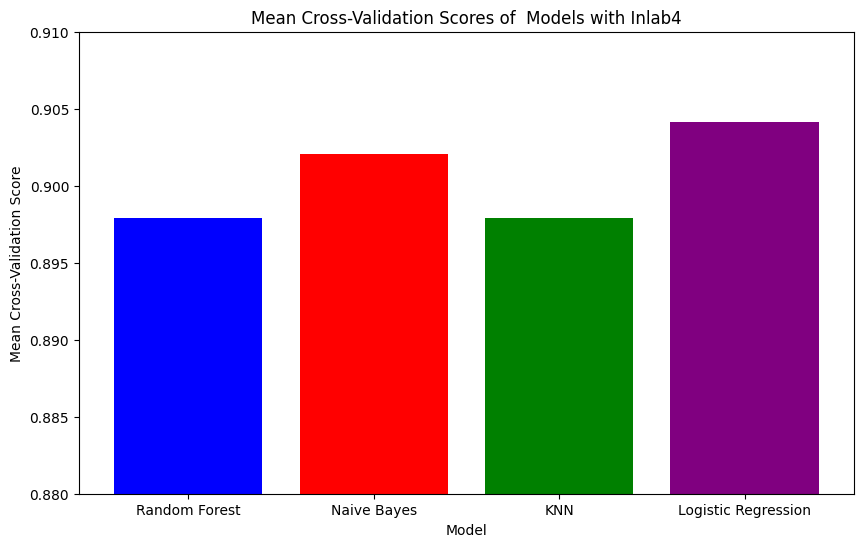

In [ ]:


# Mean Cross-Validation Scores for the models
mean_scores = {
    "Random Forest": out4rf,
    "Naive Bayes": out4nb,
    "KNN": out4knn,
    "Logistic Regression": out4lr
}

# Plotting the chart
plt.figure(figsize=(10, 6))
plt.bar(mean_scores.keys(), mean_scores.values(), color=['blue', 'red', 'green', 'purple'])
plt.xlabel("Model")
plt.ylabel("Mean Cross-Validation Score")
plt.title("Mean Cross-Validation Scores of  Models with Inlab4")
plt.ylim(0.88, 0.91)  
plt.show()

In [ ]:
Mean lab1 Random Forest Cross-Validation Score : 0.7875
Mean lab1 Naive Bayes Cross-Validation Score: 0.7916666666666667
Mean lab1 LogisticRegression Cross-Validation Score: 0.7916666666666667
Mean lab1 KNN Cross-Validation Score: 0.7833333333333333

Mean lab2  Random Forest Cross-Validation Score: 0.9020833333333333
Mean lab2 Naive Bayes Cross-Validation Score: 0.5625
Mean lab2 LogisticRegression Cross-Validation Score: 0.9020833333333333
Mean lab2 KNN Cross-Validation Score: 0.8958333333333334

Mean lab3  Random Forest Cross-Validation Score: 0.9270833333333334
Mean lab3 Naive Bayes Cross-Validation Score: 0.4333333333333333
Mean lab3 Cross-Validation Score: 0.925
Mean lab3 KNN Cross-Validation Score: 0.7416666666666667

Mean lab4  Random Forest Cross-Validation Score: 0.9083333333333332
Mean lab4 Naive Bayes Cross-Validation Score: 0.5208333333333333
Mean lab4 LogisticRegression Cross-Validation Score: 0.9041666666666666
Mean lab4 KNN Cross-Validation Score: 0.9041666666666666
---------------------------------------------------------------------------------------------------------------------

Mean Cross-Validation Score: 0.7854166666666667
Mean Naive Bayes Cross-Validation Score: 0.7854166666666667
Mean Cross-Validation Score: 0.7854166666666667
Mean KNN Cross-Validation Score: 0.7541666666666667


Mean lab2  Random Forest Cross-Validation Score:0.90
Mean lab2 Naive Bayes Cross-Validation Score: 0.8979166666666668
Mean lab2 LogisticRegression Cross-Validation Score: 0.8958333333333334
Mean lab2 KNN Cross-Validation Score: 0.9020833333333333

Mean lab3  Random Forest Cross-Validation Score: 0.9166666666666667
Mean lab3 Naive Bayes Cross-Validation Score: 0.9229166666666666
Mean lab3 Cross-Validation Score: 0.70625
Mean lab3 KNN Cross-Validation Score: 0.9229166666666666

Mean lab4  Random Forest Cross-Validation Score: 0.8979166666666668
Mean lab4 Naive Bayes Cross-Validation Score: 0.9020833333333333
Mean lab4 LogisticRegression Cross-Validation Score: 0.9041666666666666
Mean lab4 KNN Cross-Validation Score: 0.8979166666666666



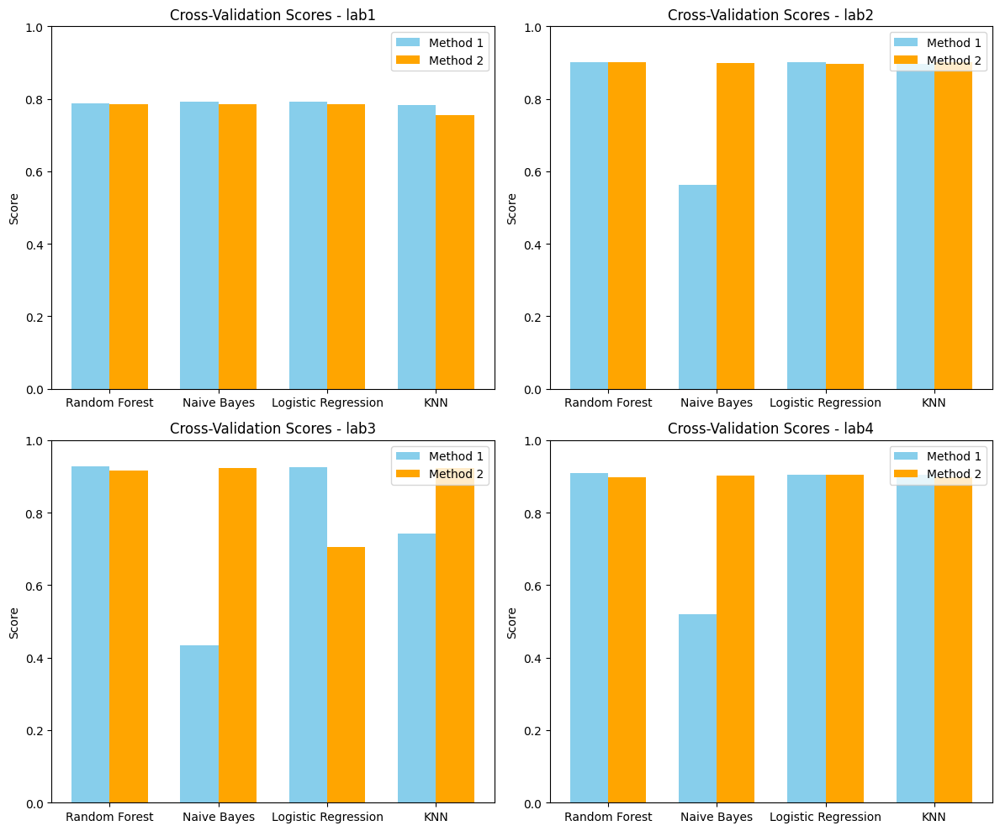

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the two methods
scores_method_1 = [
    [0.7875, 0.7917, 0.7917, 0.7833],  # lab1
    [0.9021, 0.5625, 0.9021, 0.8958],  # lab2
    [0.9271, 0.4333, 0.9250, 0.7417],  # lab3
    [0.9083, 0.5208, 0.9042, 0.9042]   # lab4
]

scores_method_2 = [
    [0.7854, 0.7854, 0.7854, 0.7542],  # lab1
    [0.90, 0.8979, 0.8958, 0.9021],    # lab2
    [0.9167, 0.9229, 0.7063, 0.9229],  # lab3
    [0.8979, 0.9021, 0.9042, 0.8979]   # lab4
]

# Labels for the models and labs
models = ['Random Forest', 'Naive Bayes', 'Logistic Regression', 'KNN']
labs = ['lab1', 'lab2', 'lab3', 'lab4']

# Set up figure
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Flatten the axes for easier access
axes = axes.flatten()

# Loop through each lab and plot its corresponding bar chart
for i in range(4):
    x = np.arange(len(models))  # the label locations
    width = 0.35  # width of the bars
    
    # Plot for method 1 and method 2
    axes[i].bar(x - width/2, scores_method_1[i], width, label='Method 1', color='skyblue')
    axes[i].bar(x + width/2, scores_method_2[i], width, label='Method 2', color='orange')
    
    # Set labels and title
    axes[i].set_title(f'Cross-Validation Scores - {labs[i]}')
    axes[i].set_ylabel('Score')
    axes[i].set_ylim(0, 1)
    axes[i].set_xticks(x)
    axes[i].set_xticklabels(models)
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()
